In [2]:

import tensorflow as tf
import keras
from keras.layers import Dense, Dropout, Input
from keras.models import Model,Sequential
from keras.layers import Conv2D, Flatten, Lambda
from keras.layers import Reshape, Conv2DTranspose
from keras.losses import mse, binary_crossentropy
from tensorflow_probability import distributions
from sklearn.neural_network import BernoulliRBM
from tensorflow.examples.tutorials.mnist import input_data
from keras import backend as K
from keras.datasets import mnist
from keras.layers.advanced_activations import LeakyReLU
from keras.optimizers import Adam
from keras.layers import BatchNormalization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm import tqdm
import argparse

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning: Passing (type, 1) or 

# Q1- RBM on MNIST data

## Restricted Boltzman machine algorithm:
A restricted boltzmann machine(RBM) is a generative stochastic artificial neural network that can learn a probability distribution over its set of inputs. Standard RBM has binary-valued hidden and visible units, and consists of a matrix of weights $W=(w_{i,j})$ a size (mxn) associated with the connection between hidden units $h_{j}$ and visible units $v_{i}$, as well as bias weights $a_{i}$ for the visible units and $b_{j}$ for the hidden units.<br>
Given these, the Energy function for the RBM is defined as,
$$E(v,h) = -\sum_i a_i v_i - \sum_j b_j h_j -\sum_i \sum_j v_i w_{i,j} h_j$$ 
or in terms of matrix notation,
$$E(v,h) = -a^{\mathrm{T}} v - b^{\mathrm{T}} h -v^{\mathrm{T}} W h$$

The probability distributions over hidden or visible nodes is defined in terms of energy function as,
$$P(v,h) = \frac{1}{Z} e^{-E(v,h)}$$
where Z is a partition function.
Similarly, the marginal probability of visible unit is the sum over all possible hidden layer configurations and given as,
$$P(v) = \frac{1}{Z} \sum_h e^{-E(v,h)}$$

The conditional probability of a configuration of the visible units v, given a configuration of the hidden units h, is
$$P(v|h) = \prod_{i=1}^m P(v_i|h)$$<br>
Conversely, the conditional probability of h given v is defined as,
$$P(h|v) = \prod_{j=1}^n P(h_j|v)$$

The individual activation probabilities are given by,<br>
$${P(h_{j}=1|v)=\sigma \left(b_{j}+\sum _{i=1}^{m}w_{i,j}v_{i}\right)}\\
P(v_i=1|h) = \sigma \left(a_i + \sum_{j=1}^n w_{i,j} h_j \right)
$$
where $\sigma$ denotes the sigmoid function.


In [0]:
class RBM:
  
    def __init__(self, images, n_components, learning_rate, batch_size, n_iter, random_state):
        self.images = images
        self.batch_size = batch_size
        self.epochs = n_iter
        self.x = 0
        self.rbm = BernoulliRBM(n_components=n_components,learning_rate=learning_rate, batch_size=batch_size, 
                                n_iter=self.epochs, random_state=random_state, verbose=1)

    def fit(self):
        self.x, _ = self.images.train.next_batch(self.batch_size)
        self.rbm.fit(self.x)
        
    def gibbs_sampling(self, k):
        for _ in range(k):
            gibbs_samp = self.rbm.gibbs(self.x)
            self.x = np.zeros_like(self.x)
            self.x[gibbs_samp] = 1
        return self.x

Extracting data/train-images-idx3-ubyte.gz
Extracting data/train-labels-idx1-ubyte.gz
Extracting data/t10k-images-idx3-ubyte.gz
Extracting data/t10k-labels-idx1-ubyte.gz
[BernoulliRBM] Iteration 1, pseudo-likelihood = -535.72, time = 0.01s
[BernoulliRBM] Iteration 2, pseudo-likelihood = -530.72, time = 0.01s
[BernoulliRBM] Iteration 3, pseudo-likelihood = -526.58, time = 0.01s
[BernoulliRBM] Iteration 4, pseudo-likelihood = -522.76, time = 0.01s
[BernoulliRBM] Iteration 5, pseudo-likelihood = -519.01, time = 0.01s
[BernoulliRBM] Iteration 6, pseudo-likelihood = -515.21, time = 0.01s
[BernoulliRBM] Iteration 7, pseudo-likelihood = -511.30, time = 0.01s
[BernoulliRBM] Iteration 8, pseudo-likelihood = -507.40, time = 0.01s
[BernoulliRBM] Iteration 9, pseudo-likelihood = -503.37, time = 0.01s
[BernoulliRBM] Iteration 10, pseudo-likelihood = -499.24, time = 0.01s
[BernoulliRBM] Iteration 11, pseudo-likelihood = -494.99, time = 0.01s
[BernoulliRBM] Iteration 12, pseudo-likelihood = -490.65, 

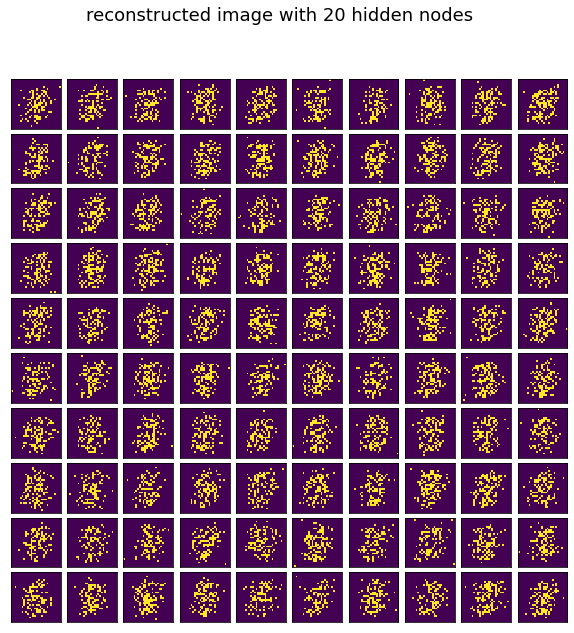

[BernoulliRBM] Iteration 1, pseudo-likelihood = -514.12, time = 0.01s
[BernoulliRBM] Iteration 2, pseudo-likelihood = -496.10, time = 0.01s
[BernoulliRBM] Iteration 3, pseudo-likelihood = -482.05, time = 0.01s
[BernoulliRBM] Iteration 4, pseudo-likelihood = -470.77, time = 0.01s
[BernoulliRBM] Iteration 5, pseudo-likelihood = -459.86, time = 0.01s
[BernoulliRBM] Iteration 6, pseudo-likelihood = -450.03, time = 0.01s
[BernoulliRBM] Iteration 7, pseudo-likelihood = -441.07, time = 0.01s
[BernoulliRBM] Iteration 8, pseudo-likelihood = -432.91, time = 0.01s
[BernoulliRBM] Iteration 9, pseudo-likelihood = -425.60, time = 0.01s
[BernoulliRBM] Iteration 10, pseudo-likelihood = -420.24, time = 0.01s
[BernoulliRBM] Iteration 11, pseudo-likelihood = -415.74, time = 0.01s
[BernoulliRBM] Iteration 12, pseudo-likelihood = -412.23, time = 0.01s
[BernoulliRBM] Iteration 13, pseudo-likelihood = -409.28, time = 0.01s
[BernoulliRBM] Iteration 14, pseudo-likelihood = -407.02, time = 0.01s
[BernoulliRBM] 

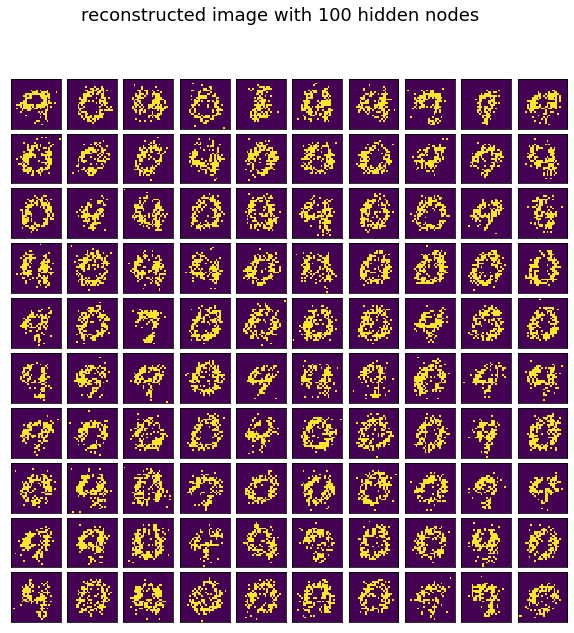

[BernoulliRBM] Iteration 1, pseudo-likelihood = -411.90, time = 0.03s
[BernoulliRBM] Iteration 2, pseudo-likelihood = -362.88, time = 0.04s
[BernoulliRBM] Iteration 3, pseudo-likelihood = -328.03, time = 0.03s
[BernoulliRBM] Iteration 4, pseudo-likelihood = -303.49, time = 0.04s
[BernoulliRBM] Iteration 5, pseudo-likelihood = -285.25, time = 0.04s
[BernoulliRBM] Iteration 6, pseudo-likelihood = -271.68, time = 0.04s
[BernoulliRBM] Iteration 7, pseudo-likelihood = -260.54, time = 0.04s
[BernoulliRBM] Iteration 8, pseudo-likelihood = -252.32, time = 0.04s
[BernoulliRBM] Iteration 9, pseudo-likelihood = -246.03, time = 0.04s
[BernoulliRBM] Iteration 10, pseudo-likelihood = -240.90, time = 0.04s
[BernoulliRBM] Iteration 11, pseudo-likelihood = -235.16, time = 0.03s
[BernoulliRBM] Iteration 12, pseudo-likelihood = -232.37, time = 0.03s
[BernoulliRBM] Iteration 13, pseudo-likelihood = -226.74, time = 0.04s
[BernoulliRBM] Iteration 14, pseudo-likelihood = -222.96, time = 0.04s
[BernoulliRBM] 

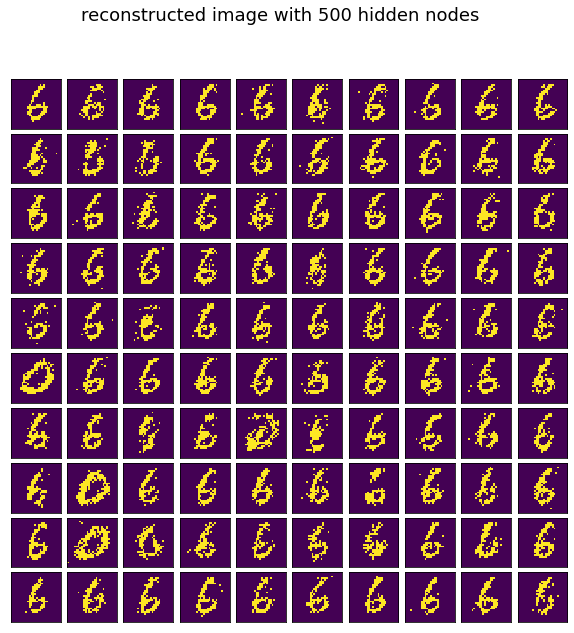

In [27]:
# Define the required number of hidden nodes
hidden_nodes_list = [20, 100, 500]
mnist = input_data.read_data_sets("data", one_hot=True)

#def
for nodes in hidden_nodes_list:
    rbm = RBM(mnist,
          n_components=nodes,
          learning_rate=0.01,
          batch_size=100,
          n_iter=2000,
          random_state=0)
    
    # fit the model and generate the samples over different hidden nodes
    rbm.fit()
    generated_sample = rbm.gibbs_sampling(1000)

    plt.figure(figsize=(10, 10))
    for i, img in enumerate(generated_sample):
        plt.subplot(10, 10, i+1)
        plt.imshow(img.reshape((28, 28)), origin='upper', interpolation='nearest',)
        plt.xticks(())
        plt.yticks(())
    plt.suptitle("reconstructed image with " + str(nodes) + " hidden nodes", fontsize=18)
    plt.subplots_adjust(wspace=0.1,hspace=0.1)
    plt.show()

# Q2- Variational Autoencoder with different code units

## Variational AutoEncoder(VAE) 
The goal of variational autoencoder(VAE) is to learn a probability distribution over a multidimensional variable x. It assumes that the data are generated by a directed graphical model $p_{\theta}(x | z)$ and that the encoder is learning an approximation $q_{\phi }(z | x)$ to the posterior distribution $p_{\theta}(z | x)$ where $\phi$ and $\theta$  denote the parameters of the encoder (recognition model) and decoder (generative model) respectively.<br>
 We optimize the variational parameters $\phi$ such that:<br>
 $$q_{\phi }(z|x) \approx p_{\theta}(z|x)$$
this approximation to the posterior help us optimize the marginal likelihood.<br>
The variational parameters $\phi$ include the weights and biases of the neural network. thus, 
$$q_{\phi }(z \mid x) = N(z; \mu, diag(\sigma))$$
For any choice of inference model $q_{\phi }(z \mid x)$, including the choice of variational parameters $\phi$, we have,
$$
log \; p_{\theta}(x) = E_{q_{\phi}(z|x)}[log \; p_{\theta}(x)] \\
log \; p_{\theta}(x) = E_{q_{\phi}(z|x)}[log \; [\frac {p_{\theta}(x,z)} {p_{\theta}(z|x)}]]
$$

$$log \; p_{\theta}(x) = E_{q_{\phi}(z|x)}[log \; [\frac {p_{\theta}(x,z)} {q_{\phi}(z|x)} \times \frac {q_{\phi}(z|x)} {p_{\theta}(z|x)} ]]$$

$$log \; p_{\theta}(x) = E_{q_{\phi}(z|x)}[log \; [\frac {p_{\theta}(x,z)} {q_{\phi}(z|x)} ]] + E_{q_{\phi}(z|x)}[log \; [\frac {q_{\phi}(z|x)} {p_{\theta}(z|x)} ]] $$\
$$log \; p_{\theta}(x) = \mathcal L(\theta,\phi;x) + D_{KL}(q_\phi(z|x)||{p_{\theta}(z|x)}) $$

where,
$$\mathcal L(\theta,\phi;x) = E_{q_{\phi}(z|x)}[log \; {p_{\theta}(x,z)} - log \; {q_{\phi}(z|x)} ]$$\
$D_{KL}(q_\phi(z|x)||{p_{\theta}(z|x)})$ is the KL Divergence between 
$q_\phi(z|x)$ and $p_{\theta}(z|x)$, which is non-negative.<br>

Since, KL diveregence is non-negative, the variational lower bound on the log-likelihood of the data would become as, 
$$
\mathcal L(\theta,\phi;x) = log \;{p_{\theta}}(x) - D_{KL}(q_\phi(z|x)||{p_{\theta}(z|x)})\\
\mathcal L(\theta,\phi;x) \leq log \;{p_{\theta}}(x)
$$




#### Task 2 - **Variational Autoencoder (VAE) on MNIST dataset with 2, 8, 16 code units training**

In [0]:
class VariationalAutoencoder:

    def __init__(self, images, code_units):
        self.images = images
        self.data = tf.placeholder(tf.float32, [None, 28, 28])
        self.code_units = code_units
        posterior = self.encode()
        self.sample_r = posterior.sample()
        prior = self.make_prior()
        
        likelihood = self.decode(self.sample_r, [28, 28]).log_prob(self.data)
        
        divergence = distributions.kl_divergence(posterior, prior)
        self.evidence = tf.reduce_mean(likelihood - divergence)
        self.optimize = tf.train.AdamOptimizer(0.001).minimize(-self.evidence)
        
        self.samples = self.decode(prior.sample(10), [28, 28]).mean()

    # creating a model with 784 inputs and 256 hidden units
    def encode(self):
        with tf.variable_scope('encoder', reuse=tf.AUTO_REUSE):
            mean = tf.layers.dense(
                tf.layers.dense(
                    tf.layers.dense(
                        tf.layers.flatten(self.data), 784, tf.nn.relu
                    ), 256, tf.nn.relu
                ), self.code_units
            )
            
            variance = tf.layers.dense(
                tf.layers.dense(
                    tf.layers.dense(
                        tf.layers.flatten(self.data), 784, tf.nn.relu
                    ), 256, tf.nn.relu
                ), self.code_units, tf.nn.softplus
            )
      
            return distributions.MultivariateNormalDiag(mean, variance)
    
    # define prior distributions
    def make_prior(self):
        mean = tf.zeros(self.code_units)
        variance = tf.ones(self.code_units)
        return distributions.MultivariateNormalDiag(mean, variance)

    # Design the Docoder model
    @staticmethod
    def decode(code, data_shape):
        with tf.variable_scope('decoder', reuse=tf.AUTO_REUSE):
            logit = tf.reshape(
                tf.layers.dense(
                    tf.layers.dense(
                        tf.layers.dense(code, 256, tf.nn.relu), 784, tf.nn.relu
                    ), np.prod(data_shape) 
                ), [-1] + data_shape
            )
  
            return distributions.Independent(distributions.Bernoulli(logit), 2)

    # Generate the constructed images for each code units over number of epochs
    def generate_images(self, epochs):
        with tf.train.MonitoredSession() as sess:
            for epoch in range(epochs):
                plt.clf()
                feed = {self.data:
                        self.images.test.images.reshape([-1, 28, 28])}
                
                test_evidence, test_codes, test_samples = sess.run(
                    [self.evidence, self.sample_r, self.samples], feed)

                for _ in range(self.images.train.num_examples // 100):
                    feed = {self.data:
                            self.images.train.next_batch(100)[0].reshape(
                                [-1, 28, 28])}
                    sess.run(self.optimize, feed)
                
                fig, axes = plt.subplots(figsize=(8,8), nrows=1, ncols=10, sharey=True, sharex=True,)

                for ax, img in zip(axes.flatten(), test_samples[0:]):
                    ax.xaxis.set_visible(False)
                    ax.yaxis.set_visible(False)
                    ax.imshow(img.reshape(28, 28))
                fig.tight_layout(pad=0.1)
                fig.suptitle('Epoch ' + str(epoch+1), fontsize=16)
                plt.show()

Extracting data/train-images-idx3-ubyte.gz
Extracting data/train-labels-idx1-ubyte.gz
Extracting data/t10k-images-idx3-ubyte.gz
Extracting data/t10k-labels-idx1-ubyte.gz
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


<Figure size 432x288 with 0 Axes>

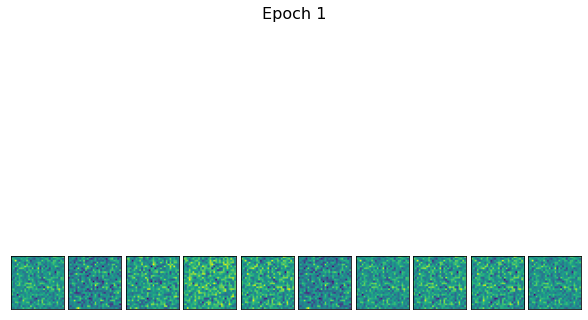

<Figure size 432x288 with 0 Axes>

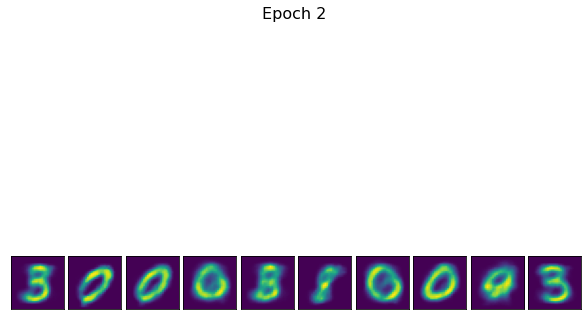

<Figure size 432x288 with 0 Axes>

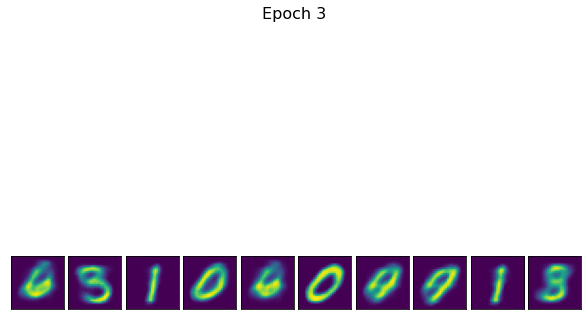

<Figure size 432x288 with 0 Axes>

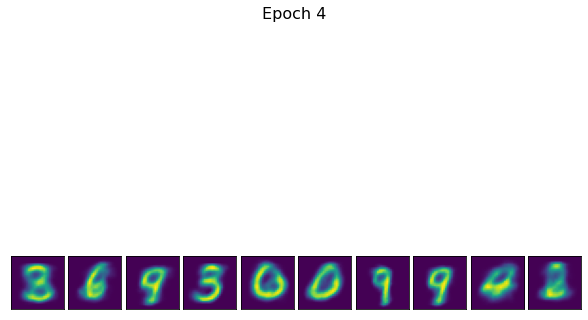

<Figure size 432x288 with 0 Axes>

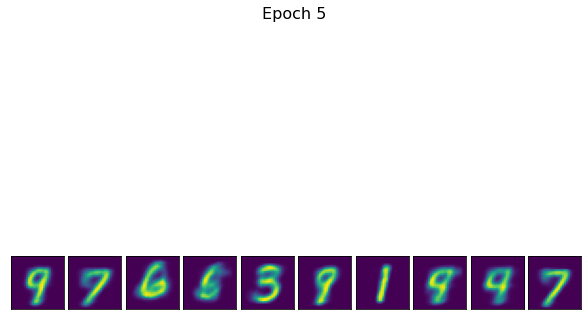

<Figure size 432x288 with 0 Axes>

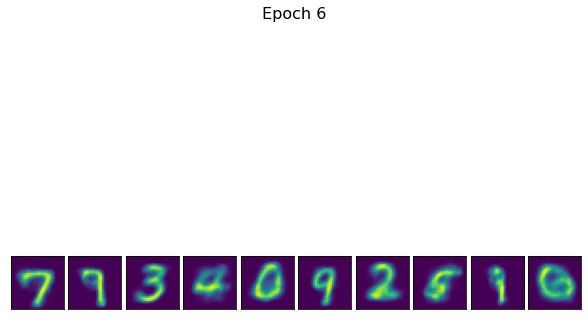

<Figure size 432x288 with 0 Axes>

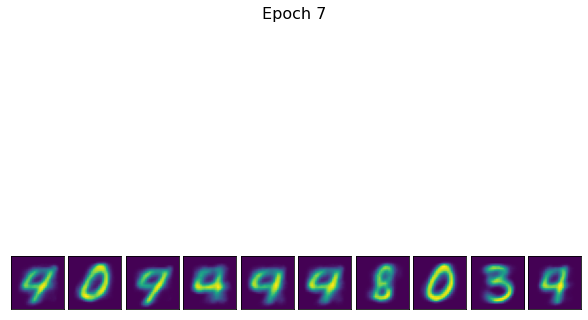

<Figure size 432x288 with 0 Axes>

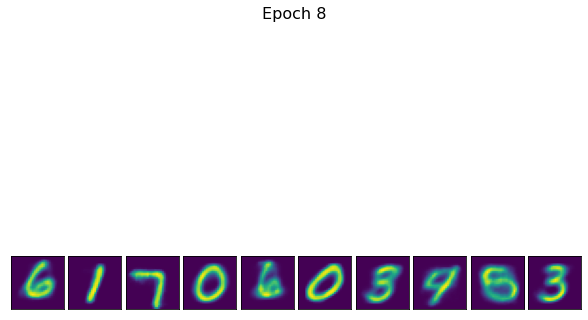

<Figure size 432x288 with 0 Axes>

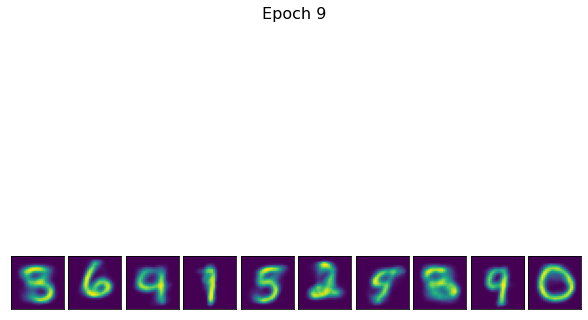

<Figure size 432x288 with 0 Axes>

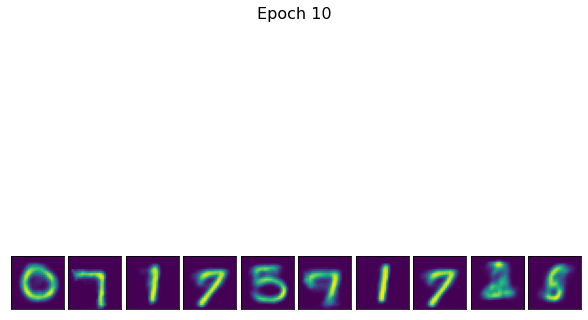

<Figure size 432x288 with 0 Axes>

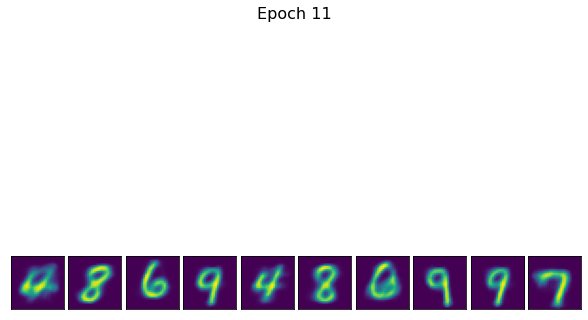

<Figure size 432x288 with 0 Axes>

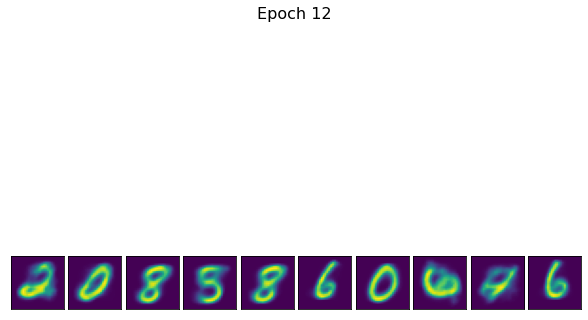

<Figure size 432x288 with 0 Axes>

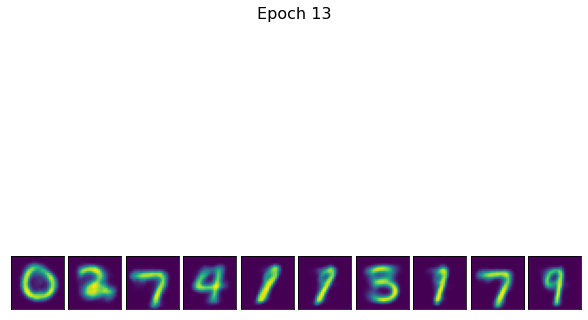

<Figure size 432x288 with 0 Axes>

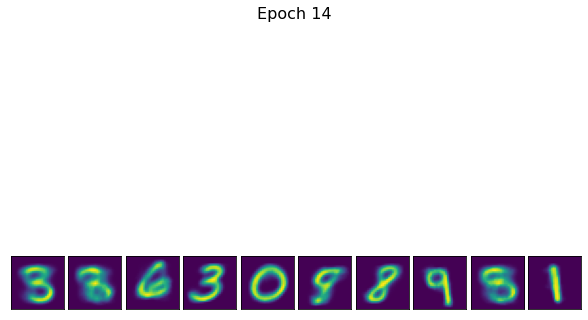

<Figure size 432x288 with 0 Axes>

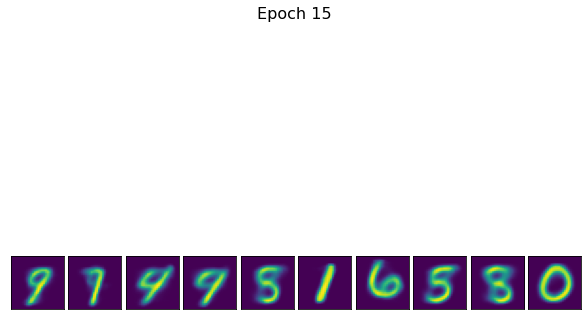

Extracting data/train-images-idx3-ubyte.gz
Extracting data/train-labels-idx1-ubyte.gz
Extracting data/t10k-images-idx3-ubyte.gz
Extracting data/t10k-labels-idx1-ubyte.gz
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


<Figure size 432x288 with 0 Axes>

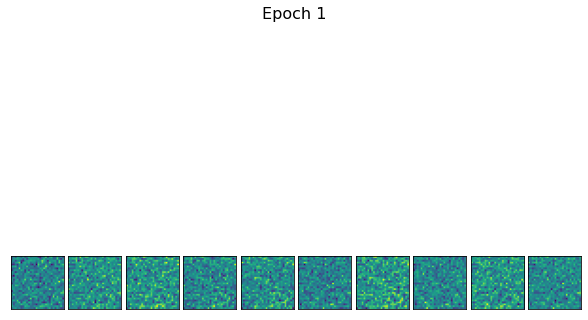

<Figure size 432x288 with 0 Axes>

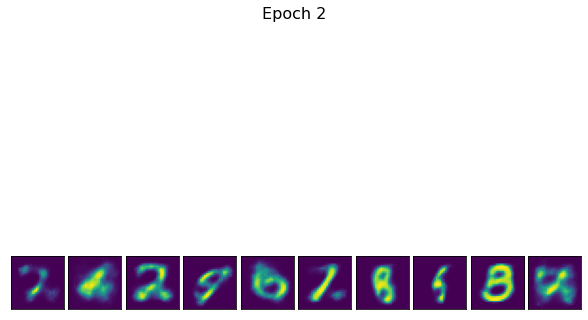

<Figure size 432x288 with 0 Axes>

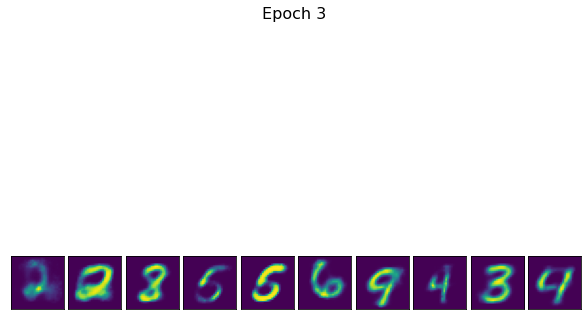

<Figure size 432x288 with 0 Axes>

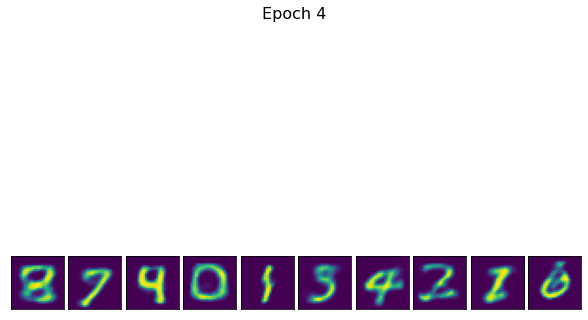

<Figure size 432x288 with 0 Axes>

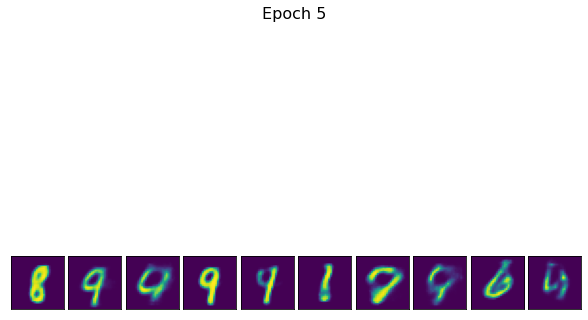

<Figure size 432x288 with 0 Axes>

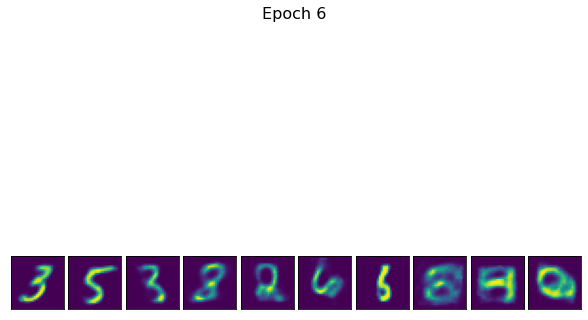

<Figure size 432x288 with 0 Axes>

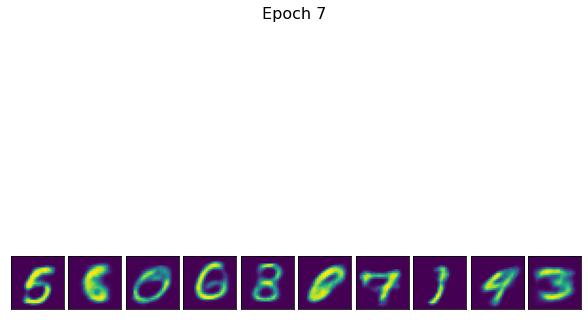

<Figure size 432x288 with 0 Axes>

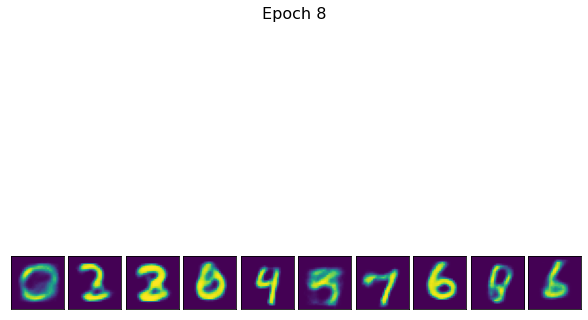

<Figure size 432x288 with 0 Axes>

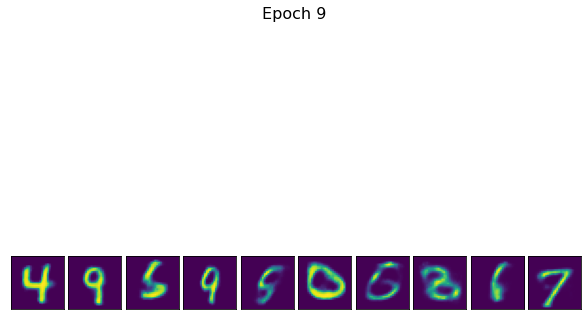

<Figure size 432x288 with 0 Axes>

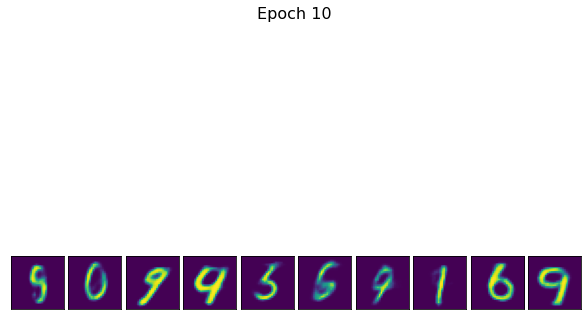

<Figure size 432x288 with 0 Axes>

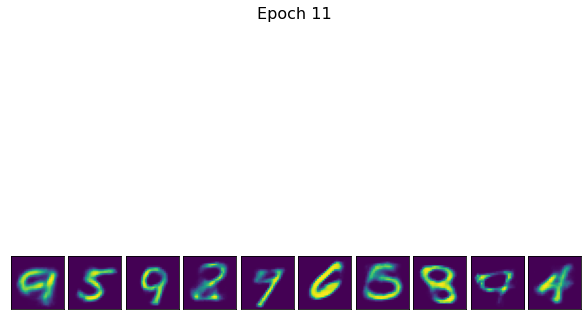

<Figure size 432x288 with 0 Axes>

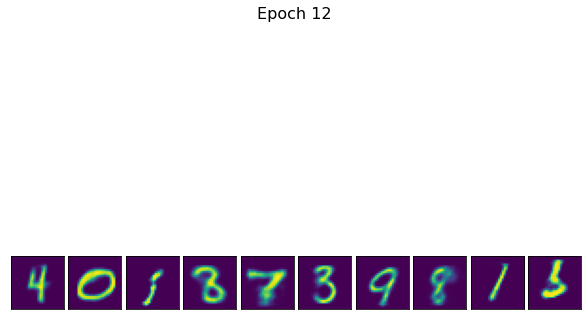

<Figure size 432x288 with 0 Axes>

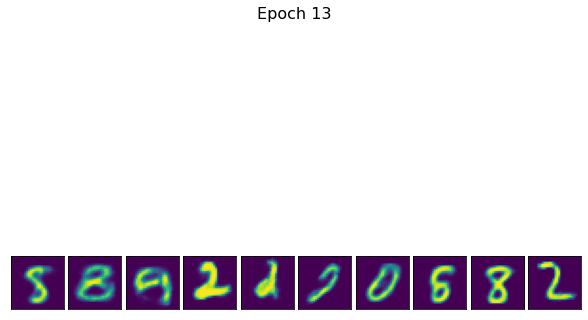

<Figure size 432x288 with 0 Axes>

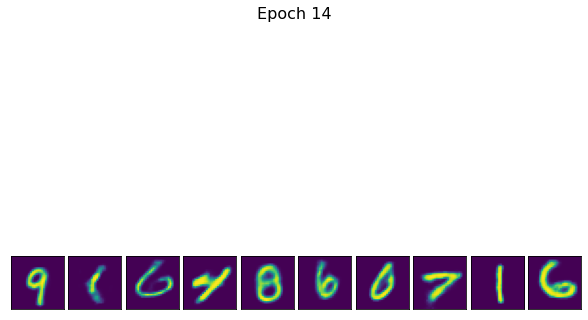

<Figure size 432x288 with 0 Axes>

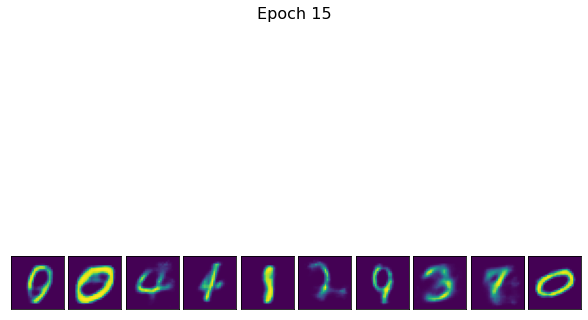

Extracting data/train-images-idx3-ubyte.gz
Extracting data/train-labels-idx1-ubyte.gz
Extracting data/t10k-images-idx3-ubyte.gz
Extracting data/t10k-labels-idx1-ubyte.gz
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


<Figure size 432x288 with 0 Axes>

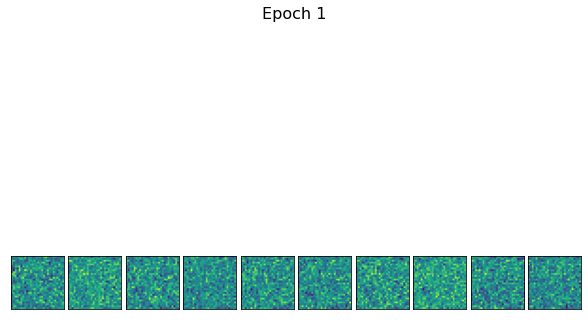

<Figure size 432x288 with 0 Axes>

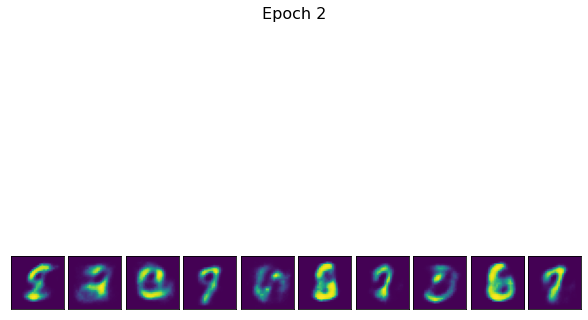

<Figure size 432x288 with 0 Axes>

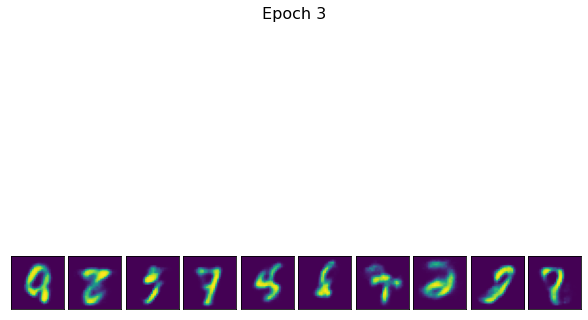

<Figure size 432x288 with 0 Axes>

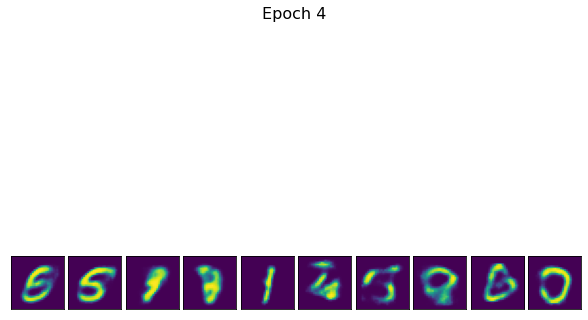

<Figure size 432x288 with 0 Axes>

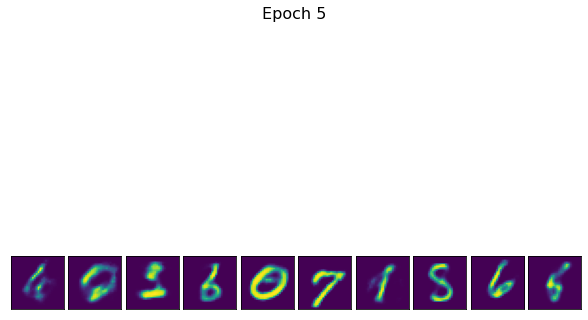

<Figure size 432x288 with 0 Axes>

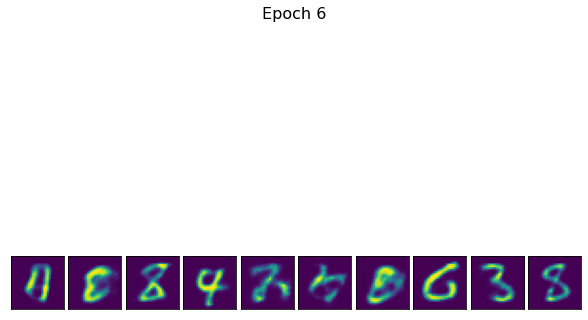

<Figure size 432x288 with 0 Axes>

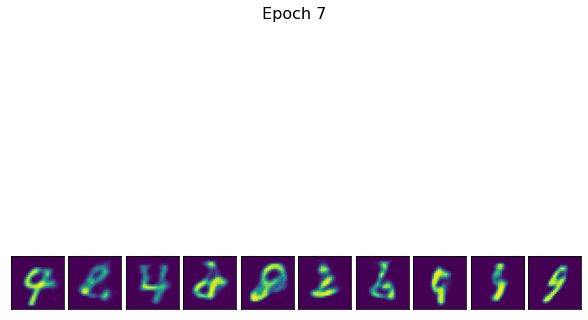

<Figure size 432x288 with 0 Axes>

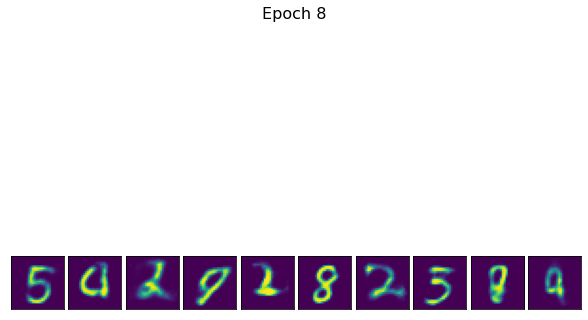

<Figure size 432x288 with 0 Axes>

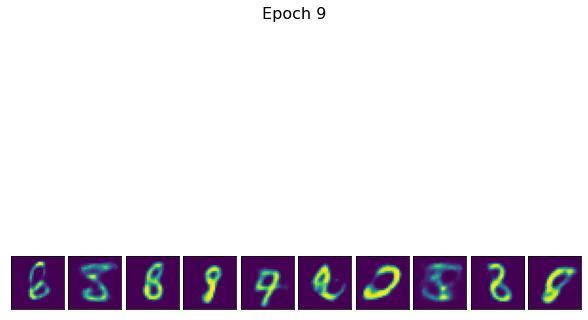

<Figure size 432x288 with 0 Axes>

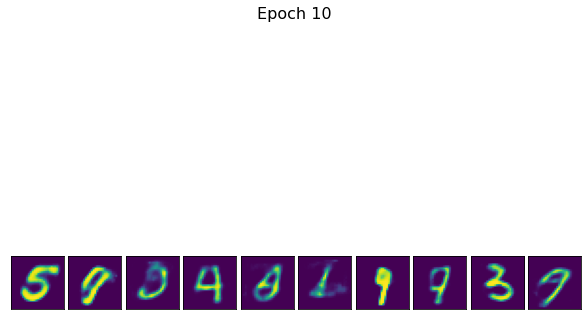

<Figure size 432x288 with 0 Axes>

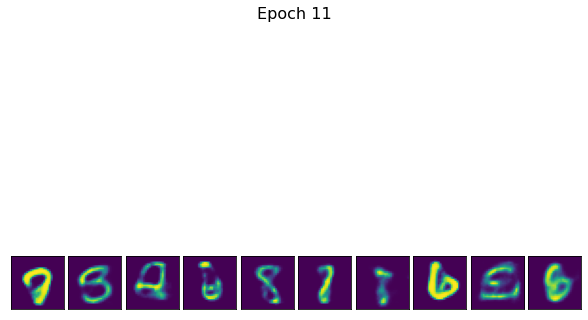

<Figure size 432x288 with 0 Axes>

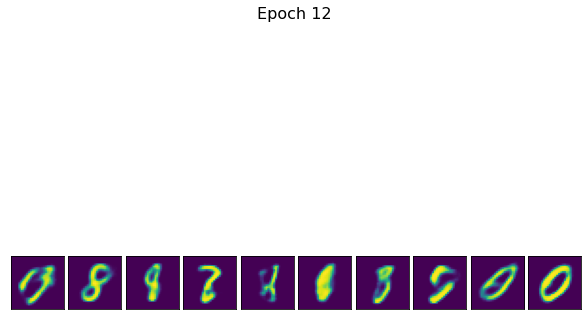

<Figure size 432x288 with 0 Axes>

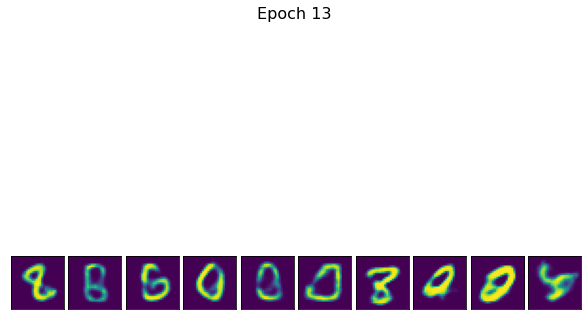

<Figure size 432x288 with 0 Axes>

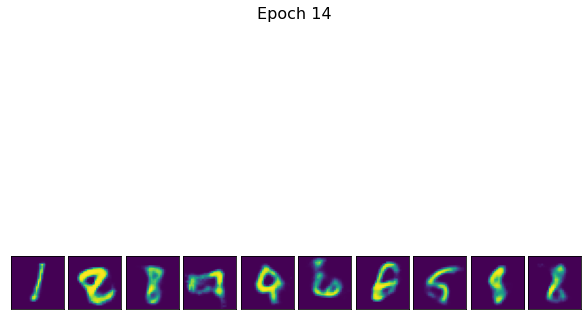

<Figure size 432x288 with 0 Axes>

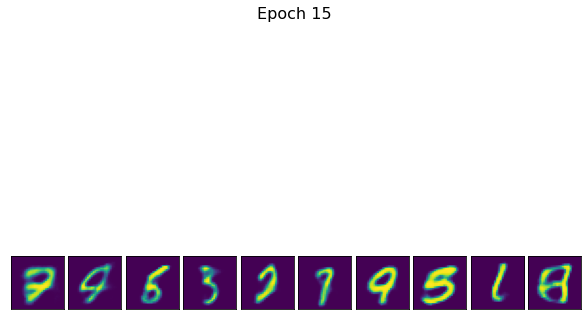

In [25]:

# Define the number of code units
code_units = [2, 8, 16]

for units in code_units:
    tf.reset_default_graph()
    mnist = input_data.read_data_sets("data", one_hot=True)
    vae = VariationalAutoencoder(mnist, units)
    vae.generate_images(epochs=15)



# Q3 - Implement convolutional VAE to generate MNIST images

In [4]:
# Load the MNIST data and normalize it
(x_train, y_train), (x_test, y_test) = mnist.load_data()

image_size = x_train.shape[1]
train_len = 10000
test_len = 1000
x_train = np.reshape(x_train[:train_len], [-1, image_size, image_size, 1])
x_test = np.reshape(x_test[:test_len], [-1, image_size, image_size, 1])
x_train = x_train.astype('float32') / 255
x_test = x_test.astype('float32') / 255
y_test = y_test[:test_len]

11493376/11490434 [==============================] - 1s 0us/step


In [0]:
def plot_results(encoder, decoder, x_test, y_test, batch_size=128):
  
    # display a 10X10 2D manifold of digits in latent space in the range of -3 to 3
    n = 10
    digit_size = 28
    figure = np.zeros((digit_size * n, digit_size * n))

    grid_x = np.linspace(-3, 3, n)
    grid_y = np.linspace(-3, 3, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[xi, yi]])
            x_decoded = decoder.predict(z_sample)
            digit = x_decoded[0].reshape(digit_size, digit_size)
            figure[i * digit_size: (i + 1) * digit_size,
                   j * digit_size: (j + 1) * digit_size] = digit

    plt.figure(figsize=(10, 10))
    start_range = digit_size // 2
    end_range = n * digit_size + start_range + 1
    pixel_range = np.arange(start_range, end_range, digit_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.imshow(figure) 
    plt.show()

In [0]:
# Initializing and defining the sampling
def sampling(args):
    z_mean, z_log_var = args
    batch = K.shape(z_mean)[0]
    dim = K.int_shape(z_mean)[1]
    # random_normal has mean=0 and std=1.0 as default values
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

In [0]:
# Initialize the parameter values
input_shape = (image_size, image_size, 1)
latent_dim = 2
epochs = 30
use_mse = True
load_weights = False
batch_size = 32
kernel_size = 3
filters = 16

In [0]:
# Build Encoder model
inputs = Input(shape=input_shape, name='encoder_input')
x = inputs

# Using convolutional neural network for encoder
for i in range(2):
    filters *= 2
    x = Conv2D(filters=filters,
               kernel_size=kernel_size,
               activation='relu',
               strides=2,
               padding='same')(x)

# shape info needed to build decoder model
shape = K.int_shape(x)

# generate latent vector
x = Flatten()(x)
x = Dense(16, activation='relu')(x)
z_mean = Dense(latent_dim, name='z_mean')(x)
z_log_var = Dense(latent_dim, name='z_log_var')(x)

z = Lambda(sampling, output_shape=(latent_dim,), name='z')([z_mean, z_log_var])

# instantiate encoder model
encoder = Model(inputs, [z_mean, z_log_var, z], name='encoder')

In [0]:
# Build Decoder model
latent_inputs = Input(shape=(latent_dim,), name='z_sampling')
x = Dense(shape[1] * shape[2] * shape[3], activation='relu')(latent_inputs)
x = Reshape((shape[1], shape[2], shape[3]))(x)

# Using deconvolutional neural network for decoder
for i in range(2):
    x = Conv2DTranspose(filters=filters,
                        kernel_size=kernel_size,
                        activation='relu',
                        strides=2,
                        padding='same')(x)
    filters //= 2

outputs = Conv2DTranspose(filters=1,
                          kernel_size=kernel_size,
                          activation='sigmoid',
                          padding='same',
                          name='decoder_output')(x)

# instantiate decoder model
decoder = Model(latent_inputs, outputs, name='decoder')

In [0]:
# Build VAE model = encoder + decoder
outputs = decoder(encoder(inputs)[2])
vae = Model(inputs, outputs, name='vae')

In [0]:
# Defining loss for the VAE
reconstruction_loss = binary_crossentropy(K.flatten(inputs),K.flatten(outputs))

reconstruction_loss *= image_size * image_size
kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
kl_loss = K.sum(kl_loss, axis=-1)
kl_loss *= -0.5
vae_loss = K.mean(reconstruction_loss + kl_loss)
vae.add_loss(vae_loss)

In [12]:
# Compile model
vae.compile(optimizer='rmsprop')

/usr/local/lib/python3.6/dist-packages/keras/engine/training_utils.py:819: UserWarning: Output decoder missing from loss dictionary. We assume this was done on purpose. The fit and evaluate APIs will not be expecting any data to be passed to decoder.
  'be expecting any data to be passed to {0}.'.format(name))


In [13]:
# Fit the model and train the convolutional VAE
vae.fit(x_train,
        epochs=epochs,
        batch_size=batch_size,
        validation_data=(x_test, None))

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where

Train on 10000 samples, validate on 1000 samples
Epoch 1/30
10000/10000 [==============================] - 18s 2ms/step - loss: 206.7892 - val_loss: 173.2467
Epoch 2/30
10000/10000 [==============================] - 18s 2ms/step - loss: 174.7146 - val_loss: 169.5503
Epoch 3/30
10000/10000 [==============================] - 17s 2ms/step - loss: 169.6063 - val_loss: 168.8425
Epoch 4/30
10000/10000 [==============================] - 17s 2ms/step - loss: 166.3420 - val_loss: 164.1074
Epoch 5/30
10000/10000 [==============================] - 17s 2ms/step - loss: 164.1745 - val_loss: 161.8344
Epoch 6/30
10000/10000 [==============================] - 17s 2ms/step - loss: 162.6786 - val_loss: 162.5955
Epoch 7/30
10000/10000 [==============================] - 16s 2ms/step - loss: 161.1690 - val_loss: 160.7765
Epoch 8/30
10000/10000 [==============================] - 16s 2ms/step - loss: 160.2252 - val

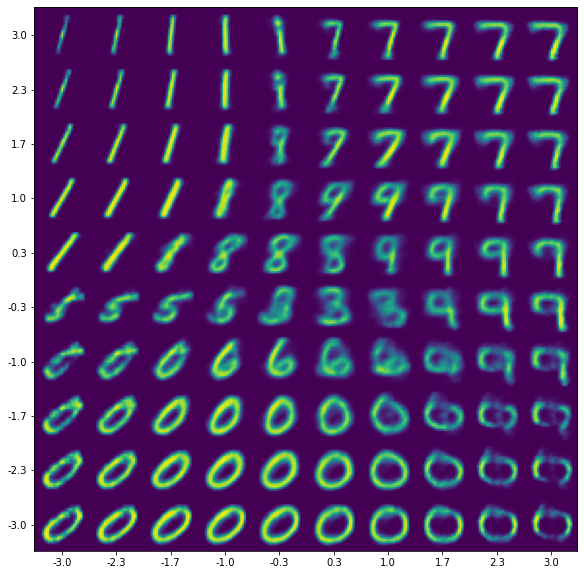

In [14]:
# Plot new MNIST images using Convolutional VAE in the 2D latent space varying in the range of -3 to 3
plot_results(encoder, decoder, x_test, y_test, batch_size=batch_size)

# Q4 - Implement GAN model on MNIST dataset and show images generated from GAN

In [0]:
# Load MNIST dataset from keras and normalize it
def load_data():
    (x_train, y_train), (x_test, y_test) = mnist.load_data()
    x_train = x_train.astype('float32')
    x_train/=255
    
    # convert shape of x_train from (60000, 28, 28) to (60000, 784) 
    x_train = x_train.reshape(60000, 784)
    return (x_train, y_train, x_test, y_test)

In [0]:
# Create a generator model
def create_generator():
    generator=Sequential()
    generator.add(Dense(units=256,input_dim=100))
    generator.add(LeakyReLU(0.2))
    generator.add(BatchNormalization(momentum=0.8))
    generator.add(Dense(units=512))
    generator.add(LeakyReLU(0.2))
    generator.add(BatchNormalization(momentum=0.8))
    generator.add(Dense(units=1024))
    generator.add(LeakyReLU(0.2))
    generator.add(BatchNormalization(momentum=0.8))
    generator.add(Dense(units=784, activation='tanh'))
    
    generator.compile(loss='binary_crossentropy', optimizer= Adam(lr=0.0002, beta_1=0.5))
    return generator

In [0]:
# Create a discriminator model
def create_discriminator():
    discriminator=Sequential()
    discriminator.add(Dense(units=1024,input_dim=784))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dropout(0.3))
    discriminator.add(Dense(units=512))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dropout(0.3))
    discriminator.add(Dense(units=256))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dense(units=1, activation='sigmoid'))
    
    discriminator.compile(loss='binary_crossentropy', optimizer= Adam(lr=0.0002, beta_1=0.5))
    return discriminator

In [0]:
# Create A GAN model using discriminator and generator models
def create_gan(discriminator, generator):
    discriminator.trainable=False
    gan_input = Input(shape=(100,))
    x = generator(gan_input)
    gan_output= discriminator(x)
    gan= Model(inputs=gan_input, outputs=gan_output)
    gan.compile(loss='binary_crossentropy', optimizer='adam')
    return gan

In [0]:
# plotting Generated images from the model
def plot_generated_images(epoch, generator, examples=100, dim=(10,10), figsize=(10,10)):
    noise= np.random.normal(loc=0, scale=1, size=[examples, 100])
    generated_images = generator.predict(noise)
    generated_images = generated_images.reshape(100,28,28)
    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i], aspect='equal', interpolation='nearest')
        plt.axis('off')
    plt.tight_layout()
    plt.savefig('gan_generated_image %d.png' %epoch)

In [0]:
# Training the model with MNIST data
def training(epochs=1, batch_size=128):
    #Loading the data
    (X_train, y_train, X_test, y_test) = load_data()
    batch_count = X_train.shape[0] / batch_size
    
    # Creating GAN
    generator= create_generator()
    discriminator= create_discriminator()
    gan = create_gan(discriminator, generator)

    for e in range(1,epochs+1 ):

        print("Epoch %d" %e)
        for _ in tqdm(range(batch_size)):
            #generate  random noise as an input  to  initialize the  generator
            noise= np.random.normal(0,1, [batch_size, 100])
            
            # Generate fake MNIST images from noised input
            generated_images = generator.predict(noise)
            
            # Get a random set of real images
            image_batch =X_train[np.random.randint(low=0,high=X_train.shape[0],size=batch_size)]
            
            #Construct different batches of real and fake data 
            X= np.concatenate([image_batch, generated_images])
            
            # Labels for generated and real data
            y_dis=np.zeros(2*batch_size)
            y_dis[:batch_size]=0.9
            
            #Pre train discriminator on fake and real data  before starting the gan. 
            discriminator.trainable=True
            dloss = discriminator.train_on_batch(X, y_dis)
            
            #Tricking the noised input of the Generator as real data
            noise= np.random.normal(0,1, [batch_size, 100])
            y_gen = np.ones(batch_size)
            
            discriminator.trainable=False
            gloss = gan.train_on_batch(noise, y_gen)
            
        if e == 1 or e % 20 == 0:
            plot_generated_images(e, generator)

  0%|          | 0/128 [00:00<?, ?it/s]

Epoch 1


  1%|          | 1/128 [00:00<00:16,  7.82it/s]

Epoch 2


  1%|          | 1/128 [00:00<00:13,  9.73it/s]

Epoch 3


  1%|          | 1/128 [00:00<00:13,  9.75it/s]

Epoch 4


  2%|▏         | 2/128 [00:00<00:12, 10.21it/s]

Epoch 5


  2%|▏         | 2/128 [00:00<00:12, 10.45it/s]

Epoch 6


  1%|          | 1/128 [00:00<00:12,  9.95it/s]

Epoch 7


  1%|          | 1/128 [00:00<00:13,  9.51it/s]

Epoch 8


  1%|          | 1/128 [00:00<00:14,  8.47it/s]

Epoch 9


  0%|          | 0/128 [00:00<?, ?it/s]

Epoch 10


  1%|          | 1/128 [00:00<00:13,  9.25it/s]

Epoch 11


  1%|          | 1/128 [00:00<00:13,  9.28it/s]

Epoch 12


  1%|          | 1/128 [00:00<00:14,  8.84it/s]

Epoch 13


  1%|          | 1/128 [00:00<00:13,  9.23it/s]

Epoch 14


  1%|          | 1/128 [00:00<00:13,  9.15it/s]

Epoch 15


  1%|          | 1/128 [00:00<00:13,  9.72it/s]

Epoch 16


  1%|          | 1/128 [00:00<00:12,  9.96it/s]

Epoch 17


  1%|          | 1/128 [00:00<00:13,  9.30it/s]

Epoch 18


  1%|          | 1/128 [00:00<00:15,  8.25it/s]

Epoch 19


  1%|          | 1/128 [00:00<00:14,  8.86it/s]

Epoch 20


  1%|          | 1/128 [00:00<00:14,  8.62it/s]

Epoch 21


  1%|          | 1/128 [00:00<00:14,  9.02it/s]

Epoch 22


  1%|          | 1/128 [00:00<00:13,  9.71it/s]

Epoch 23


  1%|          | 1/128 [00:00<00:12,  9.90it/s]

Epoch 24


  1%|          | 1/128 [00:00<00:14,  8.79it/s]

Epoch 25


  1%|          | 1/128 [00:00<00:13,  9.62it/s]

Epoch 26


  1%|          | 1/128 [00:00<00:13,  9.39it/s]

Epoch 27


  2%|▏         | 2/128 [00:00<00:12, 10.33it/s]

Epoch 28


  1%|          | 1/128 [00:00<00:13,  9.70it/s]

Epoch 29


  1%|          | 1/128 [00:00<00:14,  9.06it/s]

Epoch 30


  1%|          | 1/128 [00:00<00:13,  9.57it/s]

Epoch 31


  1%|          | 1/128 [00:00<00:14,  9.04it/s]

Epoch 32


  0%|          | 0/128 [00:00<?, ?it/s]

Epoch 33


  1%|          | 1/128 [00:00<00:12,  9.90it/s]

Epoch 34


  1%|          | 1/128 [00:00<00:13,  9.58it/s]

Epoch 35


  1%|          | 1/128 [00:00<00:13,  9.59it/s]

Epoch 36


  1%|          | 1/128 [00:00<00:16,  7.79it/s]

Epoch 37


  1%|          | 1/128 [00:00<00:13,  9.54it/s]

Epoch 38


  1%|          | 1/128 [00:00<00:13,  9.49it/s]

Epoch 39


  1%|          | 1/128 [00:00<00:13,  9.55it/s]

Epoch 40


  1%|          | 1/128 [00:00<00:14,  8.66it/s]

Epoch 41


  1%|          | 1/128 [00:00<00:14,  8.95it/s]

Epoch 42


  1%|          | 1/128 [00:00<00:13,  9.37it/s]

Epoch 43


  1%|          | 1/128 [00:00<00:15,  8.00it/s]

Epoch 44


  1%|          | 1/128 [00:00<00:13,  9.16it/s]

Epoch 45


  1%|          | 1/128 [00:00<00:12,  9.99it/s]

Epoch 46


  1%|          | 1/128 [00:00<00:13,  9.48it/s]

Epoch 47


  2%|▏         | 2/128 [00:00<00:12, 10.22it/s]

Epoch 48


  1%|          | 1/128 [00:00<00:12,  9.78it/s]

Epoch 49


  1%|          | 1/128 [00:00<00:14,  8.81it/s]

Epoch 50


  0%|          | 0/128 [00:00<?, ?it/s]

Epoch 51


  2%|▏         | 2/128 [00:00<00:11, 10.67it/s]

Epoch 52


  1%|          | 1/128 [00:00<00:13,  9.44it/s]

Epoch 53


  1%|          | 1/128 [00:00<00:13,  9.16it/s]

Epoch 54


  1%|          | 1/128 [00:00<00:14,  8.62it/s]

Epoch 55


  1%|          | 1/128 [00:00<00:12,  9.96it/s]

Epoch 56


  1%|          | 1/128 [00:00<00:12,  9.85it/s]

Epoch 57


  0%|          | 0/128 [00:00<?, ?it/s]

Epoch 58


  1%|          | 1/128 [00:00<00:12,  9.99it/s]

Epoch 59


  2%|▏         | 2/128 [00:00<00:12, 10.31it/s]

Epoch 60


  1%|          | 1/128 [00:00<00:13,  9.55it/s]

Epoch 61


  2%|▏         | 2/128 [00:00<00:11, 10.58it/s]

Epoch 62


  2%|▏         | 2/128 [00:00<00:11, 10.63it/s]

Epoch 63


  1%|          | 1/128 [00:00<00:13,  9.29it/s]

Epoch 64


  2%|▏         | 2/128 [00:00<00:12, 10.27it/s]

Epoch 65


  1%|          | 1/128 [00:00<00:13,  9.73it/s]

Epoch 66


  1%|          | 1/128 [00:00<00:13,  9.40it/s]

Epoch 67


  2%|▏         | 2/128 [00:00<00:12, 10.49it/s]

Epoch 68


  2%|▏         | 2/128 [00:00<00:12, 10.32it/s]

Epoch 69


  2%|▏         | 2/128 [00:00<00:11, 10.57it/s]

Epoch 70


  2%|▏         | 2/128 [00:00<00:12, 10.14it/s]

Epoch 71


  1%|          | 1/128 [00:00<00:12,  9.85it/s]

Epoch 72


  1%|          | 1/128 [00:00<00:13,  9.52it/s]

Epoch 73


  2%|▏         | 2/128 [00:00<00:11, 10.60it/s]

Epoch 74


  1%|          | 1/128 [00:00<00:14,  8.76it/s]

Epoch 75


  2%|▏         | 2/128 [00:00<00:11, 10.59it/s]

Epoch 76


  1%|          | 1/128 [00:00<00:13,  9.47it/s]

Epoch 77


  1%|          | 1/128 [00:00<00:12,  9.92it/s]

Epoch 78


  1%|          | 1/128 [00:00<00:13,  9.65it/s]

Epoch 79


  0%|          | 0/128 [00:00<?, ?it/s]

Epoch 80


  1%|          | 1/128 [00:00<00:13,  9.28it/s]

Epoch 81


  2%|▏         | 2/128 [00:00<00:11, 10.51it/s]

Epoch 82


  1%|          | 1/128 [00:00<00:13,  9.31it/s]

Epoch 83


  2%|▏         | 2/128 [00:00<00:12, 10.19it/s]

Epoch 84


  1%|          | 1/128 [00:00<00:13,  9.73it/s]

Epoch 85


  1%|          | 1/128 [00:00<00:14,  8.50it/s]

Epoch 86


  2%|▏         | 2/128 [00:00<00:12, 10.11it/s]

Epoch 87


  1%|          | 1/128 [00:00<00:13,  9.31it/s]

Epoch 88


  2%|▏         | 2/128 [00:00<00:11, 10.59it/s]

Epoch 89


  2%|▏         | 2/128 [00:00<00:11, 10.73it/s]

Epoch 90


  2%|▏         | 2/128 [00:00<00:12, 10.15it/s]

Epoch 91


  2%|▏         | 2/128 [00:00<00:11, 10.64it/s]

Epoch 92


  2%|▏         | 2/128 [00:00<00:11, 10.82it/s]

Epoch 93


  0%|          | 0/128 [00:00<?, ?it/s]

Epoch 94


  2%|▏         | 2/128 [00:00<00:11, 10.84it/s]

Epoch 95


  2%|▏         | 2/128 [00:00<00:12, 10.47it/s]

Epoch 96


  2%|▏         | 2/128 [00:00<00:11, 10.69it/s]

Epoch 97


  1%|          | 1/128 [00:00<00:13,  9.54it/s]

Epoch 98


  1%|          | 1/128 [00:00<00:12,  9.88it/s]

Epoch 99


  1%|          | 1/128 [00:00<00:12,  9.82it/s]

Epoch 100


100%|██████████| 128/128 [00:12<00:00, 10.38it/s]


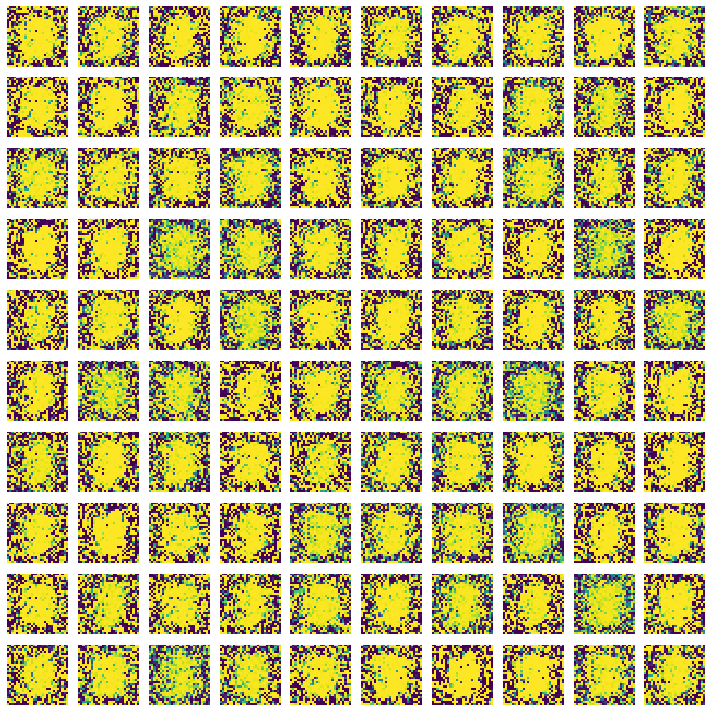

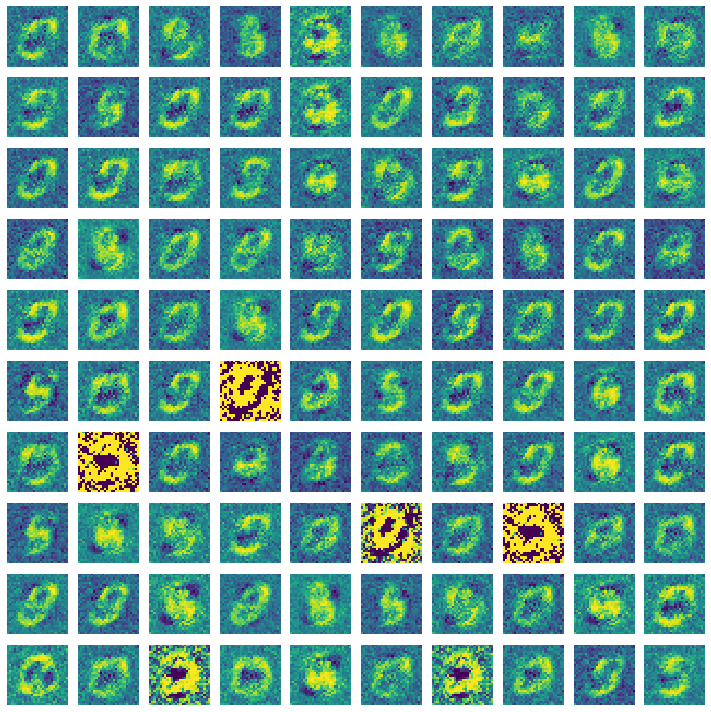

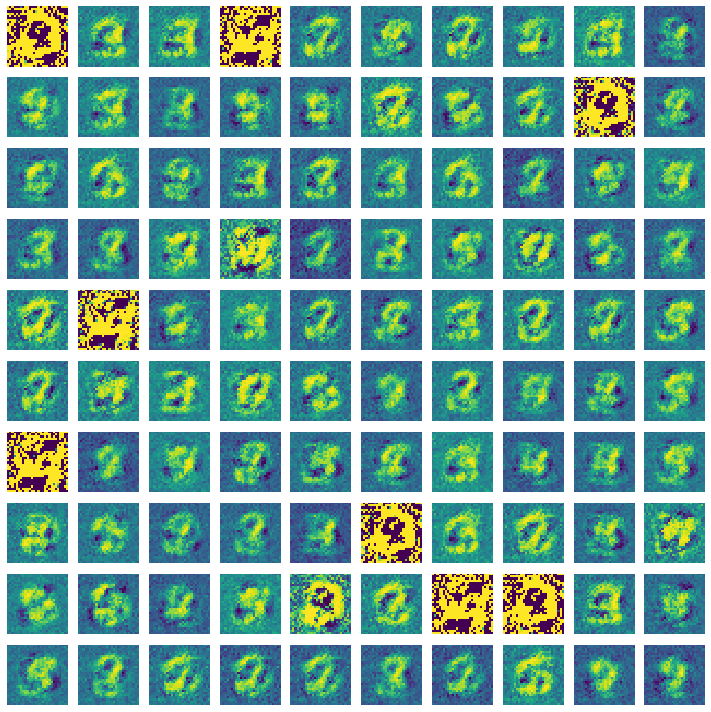

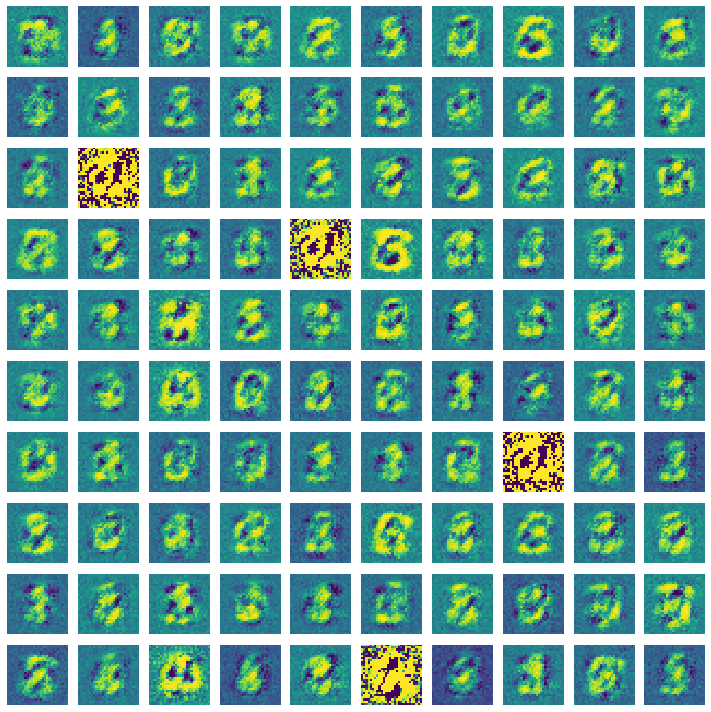

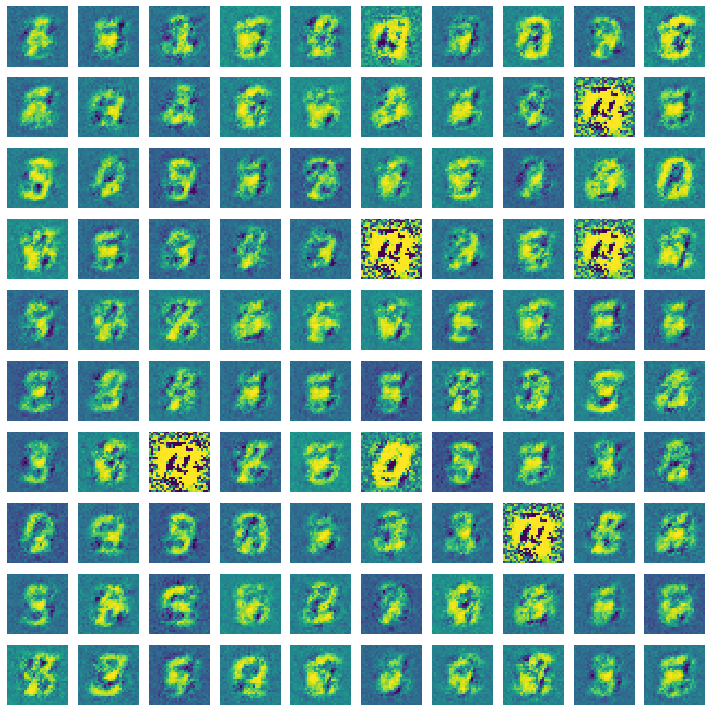

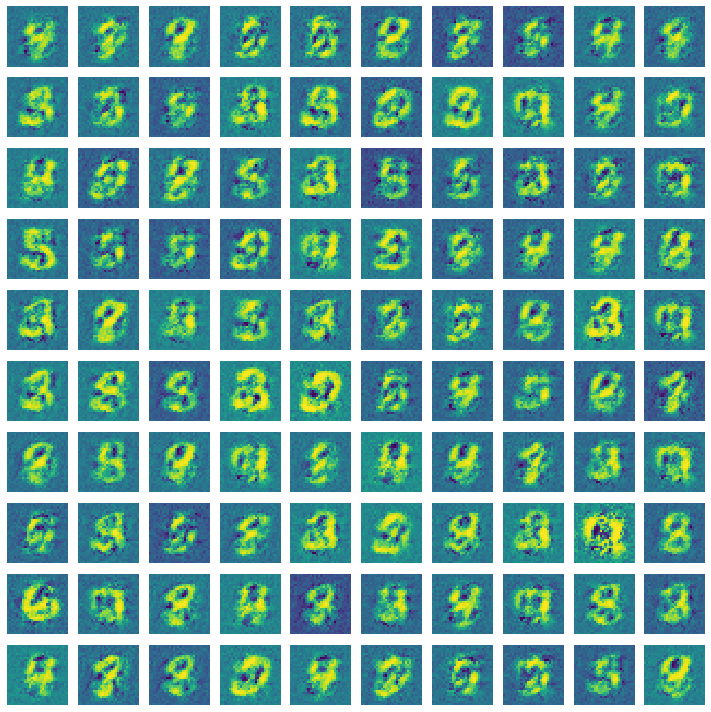

In [21]:
# generate GAN images at 100 epochs
if __name__ == '__main__':
    training(100, 128)

  0%|          | 0/128 [00:00<?, ?it/s]

Epoch 1


  1%|          | 1/128 [00:00<00:13,  9.55it/s]

Epoch 2


  0%|          | 0/128 [00:00<?, ?it/s]

Epoch 3


  2%|▏         | 2/128 [00:00<00:11, 10.72it/s]

Epoch 4


  2%|▏         | 2/128 [00:00<00:11, 10.69it/s]

Epoch 5


  0%|          | 0/128 [00:00<?, ?it/s]

Epoch 6


  2%|▏         | 2/128 [00:00<00:11, 10.80it/s]

Epoch 7


  2%|▏         | 2/128 [00:00<00:11, 10.76it/s]

Epoch 8


  2%|▏         | 2/128 [00:00<00:11, 10.89it/s]

Epoch 9


  1%|          | 1/128 [00:00<00:13,  9.63it/s]

Epoch 10


  2%|▏         | 2/128 [00:00<00:11, 10.74it/s]

Epoch 11


  2%|▏         | 2/128 [00:00<00:11, 10.51it/s]

Epoch 12


  1%|          | 1/128 [00:00<00:12,  9.94it/s]

Epoch 13


  2%|▏         | 2/128 [00:00<00:12, 10.45it/s]

Epoch 14


  2%|▏         | 2/128 [00:00<00:11, 11.04it/s]

Epoch 15


  2%|▏         | 2/128 [00:00<00:12, 10.30it/s]

Epoch 16


  2%|▏         | 2/128 [00:00<00:11, 10.57it/s]

Epoch 17


  1%|          | 1/128 [00:00<00:13,  9.71it/s]

Epoch 18


  1%|          | 1/128 [00:00<00:13,  9.48it/s]

Epoch 19


  2%|▏         | 2/128 [00:00<00:11, 10.75it/s]

Epoch 20


  1%|          | 1/128 [00:00<00:12,  9.98it/s]

Epoch 21


  2%|▏         | 2/128 [00:00<00:12, 10.35it/s]

Epoch 22


  1%|          | 1/128 [00:00<00:12,  9.86it/s]

Epoch 23


  1%|          | 1/128 [00:00<00:13,  9.69it/s]

Epoch 24


  2%|▏         | 2/128 [00:00<00:12, 10.20it/s]

Epoch 25


  2%|▏         | 2/128 [00:00<00:12, 10.06it/s]

Epoch 26


  1%|          | 1/128 [00:00<00:12,  9.96it/s]

Epoch 27


  2%|▏         | 2/128 [00:00<00:11, 10.83it/s]

Epoch 28


  2%|▏         | 2/128 [00:00<00:12, 10.41it/s]

Epoch 29


  2%|▏         | 2/128 [00:00<00:11, 11.16it/s]

Epoch 30


  2%|▏         | 2/128 [00:00<00:11, 10.72it/s]

Epoch 31


  1%|          | 1/128 [00:00<00:12,  9.91it/s]

Epoch 32


  2%|▏         | 2/128 [00:00<00:11, 11.11it/s]

Epoch 33


  2%|▏         | 2/128 [00:00<00:11, 10.96it/s]

Epoch 34


  2%|▏         | 2/128 [00:00<00:11, 10.89it/s]

Epoch 35


  2%|▏         | 2/128 [00:00<00:11, 10.82it/s]

Epoch 36


  2%|▏         | 2/128 [00:00<00:11, 11.19it/s]

Epoch 37


  2%|▏         | 2/128 [00:00<00:11, 10.70it/s]

Epoch 38


  2%|▏         | 2/128 [00:00<00:11, 11.10it/s]

Epoch 39


  2%|▏         | 2/128 [00:00<00:11, 10.87it/s]

Epoch 40


  2%|▏         | 2/128 [00:00<00:11, 11.20it/s]

Epoch 41


  2%|▏         | 2/128 [00:00<00:11, 11.11it/s]

Epoch 42


  2%|▏         | 2/128 [00:00<00:11, 11.43it/s]

Epoch 43


  2%|▏         | 2/128 [00:00<00:11, 11.34it/s]

Epoch 44


  2%|▏         | 2/128 [00:00<00:11, 11.24it/s]

Epoch 45


  2%|▏         | 2/128 [00:00<00:11, 10.76it/s]

Epoch 46


  2%|▏         | 2/128 [00:00<00:11, 11.16it/s]

Epoch 47


  2%|▏         | 2/128 [00:00<00:10, 11.55it/s]

Epoch 48


  2%|▏         | 2/128 [00:00<00:11, 10.93it/s]

Epoch 49


  2%|▏         | 2/128 [00:00<00:10, 11.48it/s]

Epoch 50


  1%|          | 1/128 [00:00<00:13,  9.48it/s]

Epoch 51


  0%|          | 0/128 [00:00<?, ?it/s]

Epoch 52


  1%|          | 1/128 [00:00<00:13,  9.57it/s]

Epoch 53


  2%|▏         | 2/128 [00:00<00:12, 10.29it/s]

Epoch 54


  1%|          | 1/128 [00:00<00:12,  9.86it/s]

Epoch 55


  2%|▏         | 2/128 [00:00<00:12, 10.36it/s]

Epoch 56


  1%|          | 1/128 [00:00<00:13,  9.44it/s]

Epoch 57


  2%|▏         | 2/128 [00:00<00:11, 10.68it/s]

Epoch 58


  2%|▏         | 2/128 [00:00<00:12, 10.34it/s]

Epoch 59


  2%|▏         | 2/128 [00:00<00:11, 10.51it/s]

Epoch 60


  2%|▏         | 2/128 [00:00<00:11, 10.56it/s]

Epoch 61


  2%|▏         | 2/128 [00:00<00:11, 10.86it/s]

Epoch 62


  2%|▏         | 2/128 [00:00<00:11, 10.65it/s]

Epoch 63


  2%|▏         | 2/128 [00:00<00:11, 10.51it/s]

Epoch 64


  2%|▏         | 2/128 [00:00<00:12, 10.42it/s]

Epoch 65


  2%|▏         | 2/128 [00:00<00:11, 10.74it/s]

Epoch 66


  2%|▏         | 2/128 [00:00<00:11, 10.78it/s]

Epoch 67


  2%|▏         | 2/128 [00:00<00:12, 10.32it/s]

Epoch 68


  1%|          | 1/128 [00:00<00:13,  9.65it/s]

Epoch 69


  1%|          | 1/128 [00:00<00:13,  9.31it/s]

Epoch 70


  2%|▏         | 2/128 [00:00<00:11, 10.52it/s]

Epoch 71


  2%|▏         | 2/128 [00:00<00:12, 10.11it/s]

Epoch 72


  1%|          | 1/128 [00:00<00:12,  9.82it/s]

Epoch 73


  0%|          | 0/128 [00:00<?, ?it/s]

Epoch 74


  1%|          | 1/128 [00:00<00:12,  9.96it/s]

Epoch 75


  2%|▏         | 2/128 [00:00<00:12, 10.34it/s]

Epoch 76


  0%|          | 0/128 [00:00<?, ?it/s]

Epoch 77


  2%|▏         | 2/128 [00:00<00:11, 10.86it/s]

Epoch 78


  1%|          | 1/128 [00:00<00:12,  9.85it/s]

Epoch 79


  1%|          | 1/128 [00:00<00:12,  9.95it/s]

Epoch 80


  1%|          | 1/128 [00:00<00:12,  9.94it/s]

Epoch 81


  2%|▏         | 2/128 [00:00<00:11, 10.86it/s]

Epoch 82


  2%|▏         | 2/128 [00:00<00:11, 10.69it/s]

Epoch 83


  2%|▏         | 2/128 [00:00<00:11, 10.67it/s]

Epoch 84


  1%|          | 1/128 [00:00<00:12,  9.85it/s]

Epoch 85


  2%|▏         | 2/128 [00:00<00:11, 10.76it/s]

Epoch 86


  1%|          | 1/128 [00:00<00:13,  9.73it/s]

Epoch 87


  2%|▏         | 2/128 [00:00<00:12, 10.35it/s]

Epoch 88


  2%|▏         | 2/128 [00:00<00:11, 10.96it/s]

Epoch 89


  2%|▏         | 2/128 [00:00<00:11, 11.23it/s]

Epoch 90


  2%|▏         | 2/128 [00:00<00:11, 10.62it/s]

Epoch 91


  2%|▏         | 2/128 [00:00<00:11, 10.80it/s]

Epoch 92


  1%|          | 1/128 [00:00<00:13,  9.47it/s]

Epoch 93


  2%|▏         | 2/128 [00:00<00:11, 10.53it/s]

Epoch 94


  1%|          | 1/128 [00:00<00:13,  9.21it/s]

Epoch 95


  1%|          | 1/128 [00:00<00:12,  9.81it/s]

Epoch 96


  2%|▏         | 2/128 [00:00<00:11, 10.65it/s]

Epoch 97


  1%|          | 1/128 [00:00<00:12,  9.78it/s]

Epoch 98


  1%|          | 1/128 [00:00<00:14,  8.78it/s]

Epoch 99


  2%|▏         | 2/128 [00:00<00:11, 10.89it/s]

Epoch 100


  1%|          | 1/128 [00:00<00:13,  9.43it/s]

Epoch 101


  1%|          | 1/128 [00:00<00:14,  9.00it/s]

Epoch 102


  2%|▏         | 2/128 [00:00<00:12, 10.37it/s]

Epoch 103


  2%|▏         | 2/128 [00:00<00:11, 10.60it/s]

Epoch 104


  2%|▏         | 2/128 [00:00<00:12, 10.37it/s]

Epoch 105


  2%|▏         | 2/128 [00:00<00:11, 11.28it/s]

Epoch 106


  2%|▏         | 2/128 [00:00<00:12, 10.42it/s]

Epoch 107


  2%|▏         | 2/128 [00:00<00:11, 10.55it/s]

Epoch 108


  1%|          | 1/128 [00:00<00:12,  9.86it/s]

Epoch 109


  2%|▏         | 2/128 [00:00<00:11, 10.61it/s]

Epoch 110


  1%|          | 1/128 [00:00<00:13,  9.66it/s]

Epoch 111


  1%|          | 1/128 [00:00<00:13,  9.74it/s]

Epoch 112


  2%|▏         | 2/128 [00:00<00:12, 10.37it/s]

Epoch 113


  2%|▏         | 2/128 [00:00<00:12, 10.45it/s]

Epoch 114


  2%|▏         | 2/128 [00:00<00:11, 10.60it/s]

Epoch 115


  1%|          | 1/128 [00:00<00:12,  9.93it/s]

Epoch 116


  2%|▏         | 2/128 [00:00<00:11, 10.99it/s]

Epoch 117


  2%|▏         | 2/128 [00:00<00:11, 10.68it/s]

Epoch 118


  1%|          | 1/128 [00:00<00:12,  9.87it/s]

Epoch 119


  1%|          | 1/128 [00:00<00:13,  9.67it/s]

Epoch 120


  2%|▏         | 2/128 [00:00<00:12, 10.18it/s]

Epoch 121


  2%|▏         | 2/128 [00:00<00:11, 10.55it/s]

Epoch 122


  1%|          | 1/128 [00:00<00:13,  9.51it/s]

Epoch 123


  2%|▏         | 2/128 [00:00<00:11, 10.67it/s]

Epoch 124


  1%|          | 1/128 [00:00<00:14,  8.69it/s]

Epoch 125


  1%|          | 1/128 [00:00<00:14,  8.82it/s]

Epoch 126


  2%|▏         | 2/128 [00:00<00:11, 10.83it/s]

Epoch 127


  2%|▏         | 2/128 [00:00<00:11, 10.77it/s]

Epoch 128


  2%|▏         | 2/128 [00:00<00:12, 10.34it/s]

Epoch 129


  1%|          | 1/128 [00:00<00:13,  9.56it/s]

Epoch 130


  2%|▏         | 2/128 [00:00<00:11, 10.92it/s]

Epoch 131


  2%|▏         | 2/128 [00:00<00:11, 10.67it/s]

Epoch 132


  2%|▏         | 2/128 [00:00<00:11, 10.70it/s]

Epoch 133


  1%|          | 1/128 [00:00<00:13,  9.75it/s]

Epoch 134


  1%|          | 1/128 [00:00<00:12,  9.87it/s]

Epoch 135


  2%|▏         | 2/128 [00:00<00:11, 10.64it/s]

Epoch 136


  2%|▏         | 2/128 [00:00<00:11, 10.84it/s]

Epoch 137


  2%|▏         | 2/128 [00:00<00:12, 10.30it/s]

Epoch 138


  1%|          | 1/128 [00:00<00:13,  9.16it/s]

Epoch 139


  2%|▏         | 2/128 [00:00<00:11, 10.59it/s]

Epoch 140


  2%|▏         | 2/128 [00:00<00:11, 10.67it/s]

Epoch 141


  2%|▏         | 2/128 [00:00<00:12, 10.38it/s]

Epoch 142


  2%|▏         | 2/128 [00:00<00:11, 10.99it/s]

Epoch 143


  1%|          | 1/128 [00:00<00:12,  9.93it/s]

Epoch 144


  1%|          | 1/128 [00:00<00:13,  9.15it/s]

Epoch 145


  1%|          | 1/128 [00:00<00:13,  9.44it/s]

Epoch 146


  1%|          | 1/128 [00:00<00:13,  9.17it/s]

Epoch 147


  2%|▏         | 2/128 [00:00<00:12, 10.21it/s]

Epoch 148


  2%|▏         | 2/128 [00:00<00:11, 10.85it/s]

Epoch 149


  2%|▏         | 2/128 [00:00<00:12, 10.41it/s]

Epoch 150


  1%|          | 1/128 [00:00<00:12,  9.97it/s]

Epoch 151


  2%|▏         | 2/128 [00:00<00:12, 10.28it/s]

Epoch 152


  2%|▏         | 2/128 [00:00<00:12, 10.29it/s]

Epoch 153


  0%|          | 0/128 [00:00<?, ?it/s]

Epoch 154


  1%|          | 1/128 [00:00<00:12,  9.97it/s]

Epoch 155


  1%|          | 1/128 [00:00<00:13,  9.71it/s]

Epoch 156


  1%|          | 1/128 [00:00<00:12,  9.86it/s]

Epoch 157


  0%|          | 0/128 [00:00<?, ?it/s]

Epoch 158


  2%|▏         | 2/128 [00:00<00:12, 10.44it/s]

Epoch 159


  2%|▏         | 2/128 [00:00<00:11, 10.81it/s]

Epoch 160


  2%|▏         | 2/128 [00:00<00:11, 10.60it/s]

Epoch 161


  1%|          | 1/128 [00:00<00:13,  9.73it/s]

Epoch 162


  2%|▏         | 2/128 [00:00<00:12, 10.36it/s]

Epoch 163


  2%|▏         | 2/128 [00:00<00:11, 10.86it/s]

Epoch 164


  2%|▏         | 2/128 [00:00<00:11, 10.96it/s]

Epoch 165


  2%|▏         | 2/128 [00:00<00:11, 10.51it/s]

Epoch 166


  1%|          | 1/128 [00:00<00:13,  9.44it/s]

Epoch 167


  2%|▏         | 2/128 [00:00<00:11, 10.55it/s]

Epoch 168


  2%|▏         | 2/128 [00:00<00:11, 11.10it/s]

Epoch 169


  1%|          | 1/128 [00:00<00:12,  9.80it/s]

Epoch 170


  1%|          | 1/128 [00:00<00:13,  9.30it/s]

Epoch 171


  2%|▏         | 2/128 [00:00<00:11, 10.68it/s]

Epoch 172


  1%|          | 1/128 [00:00<00:13,  9.40it/s]

Epoch 173


  1%|          | 1/128 [00:00<00:12,  9.96it/s]

Epoch 174


  1%|          | 1/128 [00:00<00:15,  8.08it/s]

Epoch 175


  1%|          | 1/128 [00:00<00:13,  9.76it/s]

Epoch 176


  1%|          | 1/128 [00:00<00:13,  9.20it/s]

Epoch 177


  1%|          | 1/128 [00:00<00:14,  8.77it/s]

Epoch 178


  1%|          | 1/128 [00:00<00:14,  9.02it/s]

Epoch 179


  1%|          | 1/128 [00:00<00:13,  9.13it/s]

Epoch 180


  1%|          | 1/128 [00:00<00:14,  8.72it/s]

Epoch 181


  1%|          | 1/128 [00:00<00:15,  8.32it/s]

Epoch 182


  1%|          | 1/128 [00:00<00:12,  9.92it/s]

Epoch 183


  1%|          | 1/128 [00:00<00:14,  8.69it/s]

Epoch 184


  1%|          | 1/128 [00:00<00:13,  9.24it/s]

Epoch 185


  1%|          | 1/128 [00:00<00:13,  9.35it/s]

Epoch 186


  1%|          | 1/128 [00:00<00:13,  9.07it/s]

Epoch 187


  1%|          | 1/128 [00:00<00:14,  8.90it/s]

Epoch 188


  1%|          | 1/128 [00:00<00:15,  8.19it/s]

Epoch 189


  1%|          | 1/128 [00:00<00:14,  8.57it/s]

Epoch 190


  1%|          | 1/128 [00:00<00:16,  7.74it/s]

Epoch 191


  1%|          | 1/128 [00:00<00:14,  8.52it/s]

Epoch 192


  1%|          | 1/128 [00:00<00:14,  8.61it/s]

Epoch 193


  1%|          | 1/128 [00:00<00:15,  8.31it/s]

Epoch 194


  1%|          | 1/128 [00:00<00:15,  8.35it/s]

Epoch 195


  1%|          | 1/128 [00:00<00:15,  8.41it/s]

Epoch 196


  1%|          | 1/128 [00:00<00:14,  8.76it/s]

Epoch 197


  1%|          | 1/128 [00:00<00:15,  8.35it/s]

Epoch 198


  1%|          | 1/128 [00:00<00:16,  7.62it/s]

Epoch 199


  1%|          | 1/128 [00:00<00:16,  7.49it/s]

Epoch 200


  1%|          | 1/128 [00:00<00:16,  7.69it/s]

Epoch 201


  1%|          | 1/128 [00:00<00:15,  8.19it/s]

Epoch 202


  1%|          | 1/128 [00:00<00:14,  8.52it/s]

Epoch 203


  1%|          | 1/128 [00:00<00:14,  8.86it/s]

Epoch 204


  1%|          | 1/128 [00:00<00:15,  8.12it/s]

Epoch 205


  1%|          | 1/128 [00:00<00:16,  7.87it/s]

Epoch 206


  1%|          | 1/128 [00:00<00:15,  8.34it/s]

Epoch 207


  1%|          | 1/128 [00:00<00:15,  8.34it/s]

Epoch 208


  1%|          | 1/128 [00:00<00:16,  7.82it/s]

Epoch 209


  1%|          | 1/128 [00:00<00:14,  9.02it/s]

Epoch 210


  1%|          | 1/128 [00:00<00:15,  8.12it/s]

Epoch 211


  1%|          | 1/128 [00:00<00:16,  7.68it/s]

Epoch 212


  1%|          | 1/128 [00:00<00:16,  7.80it/s]

Epoch 213


  1%|          | 1/128 [00:00<00:15,  8.38it/s]

Epoch 214


  1%|          | 1/128 [00:00<00:15,  8.25it/s]

Epoch 215


  1%|          | 1/128 [00:00<00:14,  8.68it/s]

Epoch 216


  1%|          | 1/128 [00:00<00:16,  7.64it/s]

Epoch 217


  1%|          | 1/128 [00:00<00:14,  8.74it/s]

Epoch 218


  1%|          | 1/128 [00:00<00:15,  8.06it/s]

Epoch 219


  1%|          | 1/128 [00:00<00:16,  7.90it/s]

Epoch 220


  1%|          | 1/128 [00:00<00:14,  8.49it/s]

Epoch 221


  1%|          | 1/128 [00:00<00:15,  8.04it/s]

Epoch 222


  1%|          | 1/128 [00:00<00:15,  8.45it/s]

Epoch 223


  1%|          | 1/128 [00:00<00:16,  7.75it/s]

Epoch 224


  1%|          | 1/128 [00:00<00:15,  8.16it/s]

Epoch 225


  1%|          | 1/128 [00:00<00:14,  8.87it/s]

Epoch 226


  1%|          | 1/128 [00:00<00:17,  7.37it/s]

Epoch 227


  1%|          | 1/128 [00:00<00:15,  8.21it/s]

Epoch 228


  1%|          | 1/128 [00:00<00:15,  8.10it/s]

Epoch 229


  1%|          | 1/128 [00:00<00:14,  8.72it/s]

Epoch 230


  1%|          | 1/128 [00:00<00:14,  8.58it/s]

Epoch 231


  1%|          | 1/128 [00:00<00:16,  7.86it/s]

Epoch 232


  1%|          | 1/128 [00:00<00:15,  8.18it/s]

Epoch 233


  1%|          | 1/128 [00:00<00:14,  8.58it/s]

Epoch 234


  1%|          | 1/128 [00:00<00:15,  8.26it/s]

Epoch 235


  1%|          | 1/128 [00:00<00:16,  7.55it/s]

Epoch 236


  1%|          | 1/128 [00:00<00:16,  7.75it/s]

Epoch 237


  1%|          | 1/128 [00:00<00:16,  7.75it/s]

Epoch 238


  1%|          | 1/128 [00:00<00:16,  7.81it/s]

Epoch 239


  1%|          | 1/128 [00:00<00:16,  7.72it/s]

Epoch 240


  1%|          | 1/128 [00:00<00:16,  7.70it/s]

Epoch 241


  1%|          | 1/128 [00:00<00:17,  7.46it/s]

Epoch 242


  1%|          | 1/128 [00:00<00:15,  8.01it/s]

Epoch 243


  1%|          | 1/128 [00:00<00:15,  8.34it/s]

Epoch 244


  1%|          | 1/128 [00:00<00:15,  8.44it/s]

Epoch 245


  1%|          | 1/128 [00:00<00:15,  8.07it/s]

Epoch 246


  1%|          | 1/128 [00:00<00:14,  8.51it/s]

Epoch 247


  1%|          | 1/128 [00:00<00:16,  7.65it/s]

Epoch 248


  1%|          | 1/128 [00:00<00:16,  7.77it/s]

Epoch 249


  1%|          | 1/128 [00:00<00:16,  7.47it/s]

Epoch 250


  1%|          | 1/128 [00:00<00:15,  8.31it/s]

Epoch 251


  1%|          | 1/128 [00:00<00:15,  7.97it/s]

Epoch 252


  1%|          | 1/128 [00:00<00:15,  7.95it/s]

Epoch 253


  1%|          | 1/128 [00:00<00:15,  8.07it/s]

Epoch 254


  1%|          | 1/128 [00:00<00:14,  8.75it/s]

Epoch 255


  1%|          | 1/128 [00:00<00:15,  8.23it/s]

Epoch 256


  1%|          | 1/128 [00:00<00:14,  8.74it/s]

Epoch 257


  1%|          | 1/128 [00:00<00:15,  7.99it/s]

Epoch 258


  1%|          | 1/128 [00:00<00:15,  8.11it/s]

Epoch 259


  1%|          | 1/128 [00:00<00:17,  7.24it/s]

Epoch 260


  1%|          | 1/128 [00:00<00:15,  8.08it/s]

Epoch 261


  1%|          | 1/128 [00:00<00:14,  8.68it/s]

Epoch 262


  1%|          | 1/128 [00:00<00:15,  8.28it/s]

Epoch 263


  1%|          | 1/128 [00:00<00:15,  8.39it/s]

Epoch 264


  1%|          | 1/128 [00:00<00:17,  7.45it/s]

Epoch 265


  1%|          | 1/128 [00:00<00:15,  8.41it/s]

Epoch 266


  1%|          | 1/128 [00:00<00:14,  8.51it/s]

Epoch 267


  1%|          | 1/128 [00:00<00:15,  8.11it/s]

Epoch 268


  1%|          | 1/128 [00:00<00:14,  8.61it/s]

Epoch 269


  1%|          | 1/128 [00:00<00:15,  8.23it/s]

Epoch 270


  1%|          | 1/128 [00:00<00:15,  8.19it/s]

Epoch 271


  1%|          | 1/128 [00:00<00:15,  8.35it/s]

Epoch 272


  1%|          | 1/128 [00:00<00:15,  8.21it/s]

Epoch 273


  1%|          | 1/128 [00:00<00:14,  8.50it/s]

Epoch 274


  1%|          | 1/128 [00:00<00:17,  7.39it/s]

Epoch 275


  1%|          | 1/128 [00:00<00:16,  7.50it/s]

Epoch 276


  1%|          | 1/128 [00:00<00:16,  7.84it/s]

Epoch 277


  1%|          | 1/128 [00:00<00:14,  8.86it/s]

Epoch 278


  1%|          | 1/128 [00:00<00:17,  7.43it/s]

Epoch 279


  1%|          | 1/128 [00:00<00:15,  8.45it/s]

Epoch 280


  1%|          | 1/128 [00:00<00:15,  8.30it/s]

Epoch 281


  1%|          | 1/128 [00:00<00:15,  7.98it/s]

Epoch 282


  1%|          | 1/128 [00:00<00:15,  7.95it/s]

Epoch 283


  1%|          | 1/128 [00:00<00:13,  9.22it/s]

Epoch 284


  1%|          | 1/128 [00:00<00:15,  8.05it/s]

Epoch 285


  1%|          | 1/128 [00:00<00:15,  8.26it/s]

Epoch 286


  1%|          | 1/128 [00:00<00:15,  8.10it/s]

Epoch 287


  1%|          | 1/128 [00:00<00:14,  8.77it/s]

Epoch 288


  1%|          | 1/128 [00:00<00:17,  7.45it/s]

Epoch 289


  1%|          | 1/128 [00:00<00:16,  7.72it/s]

Epoch 290


  1%|          | 1/128 [00:00<00:14,  8.66it/s]

Epoch 291


  1%|          | 1/128 [00:00<00:18,  6.99it/s]

Epoch 292


  1%|          | 1/128 [00:00<00:15,  8.28it/s]

Epoch 293


  1%|          | 1/128 [00:00<00:15,  8.34it/s]

Epoch 294


  1%|          | 1/128 [00:00<00:16,  7.93it/s]

Epoch 295


  1%|          | 1/128 [00:00<00:16,  7.70it/s]

Epoch 296


  1%|          | 1/128 [00:00<00:14,  8.53it/s]

Epoch 297


  1%|          | 1/128 [00:00<00:17,  7.36it/s]

Epoch 298


  1%|          | 1/128 [00:00<00:16,  7.52it/s]

Epoch 299


  1%|          | 1/128 [00:00<00:14,  8.67it/s]

Epoch 300


100%|██████████| 128/128 [00:15<00:00,  8.22it/s]


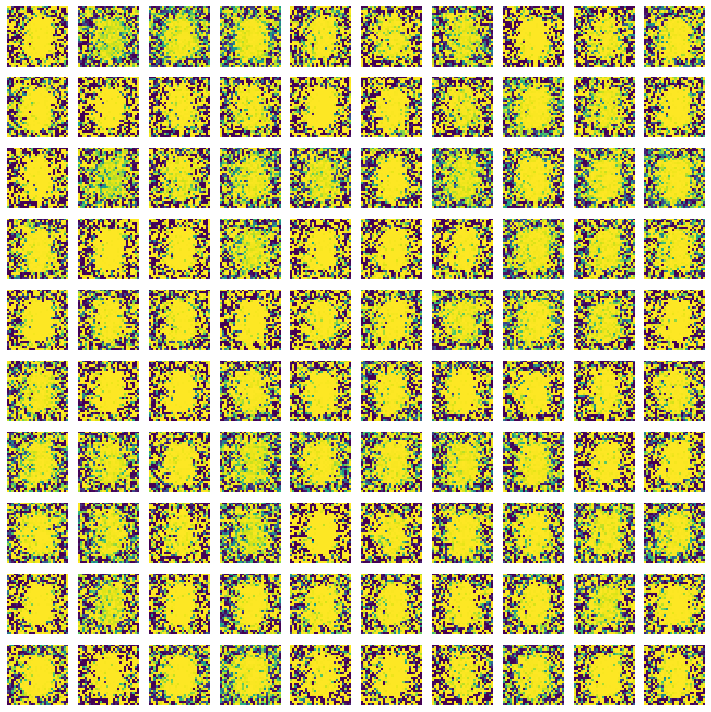

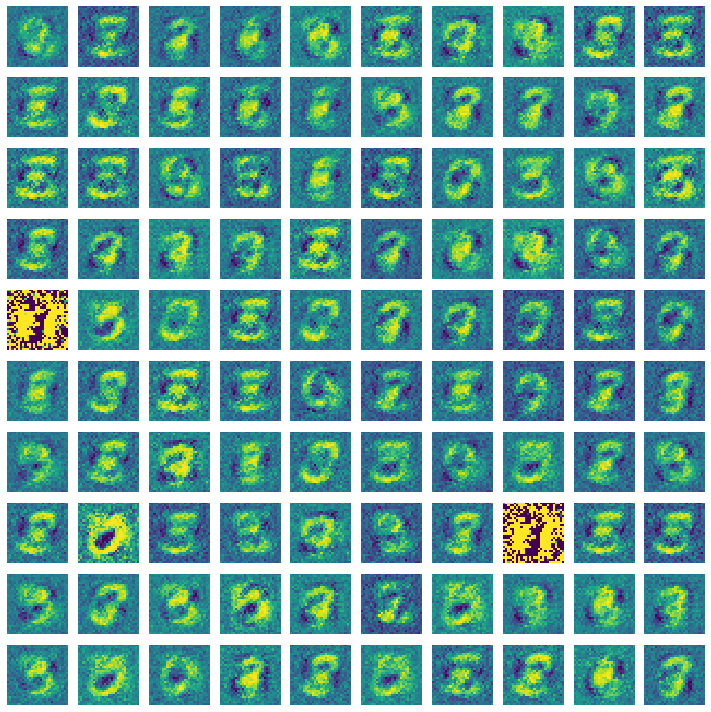

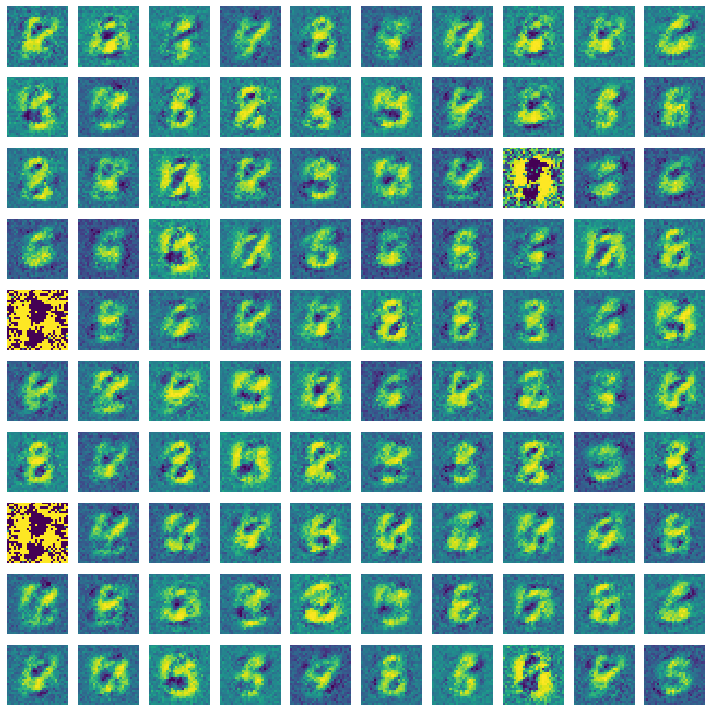

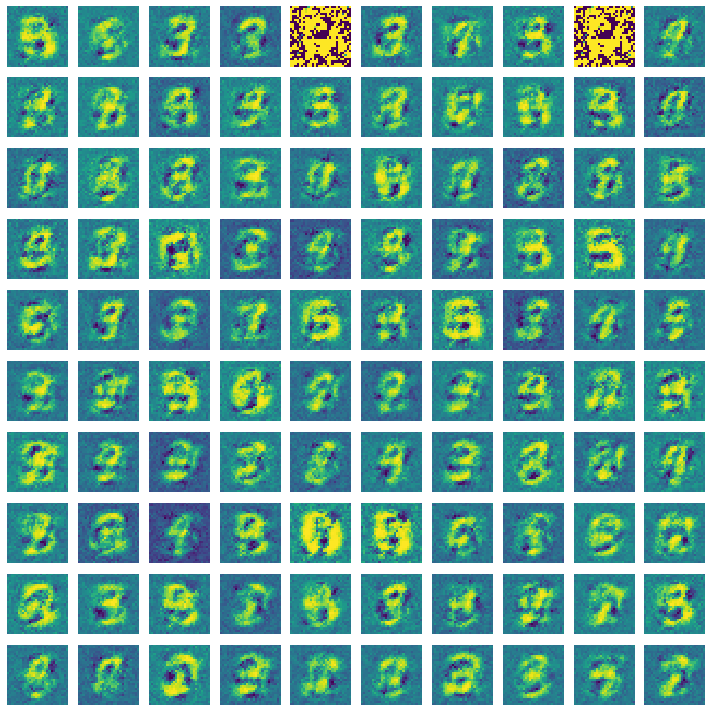

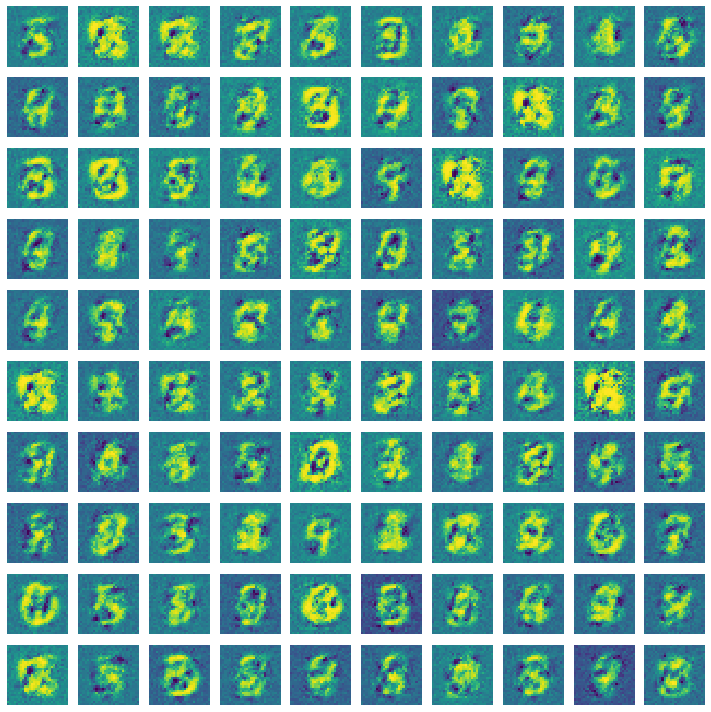

...

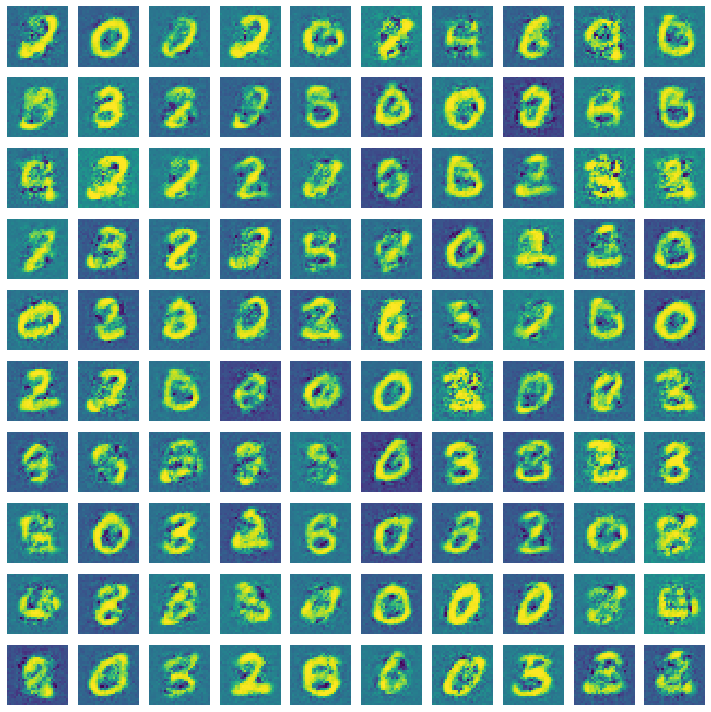

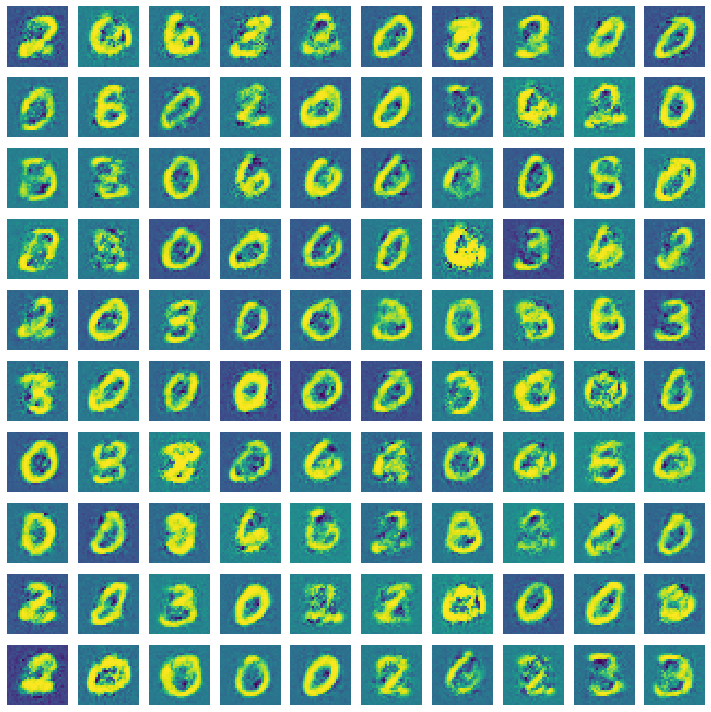

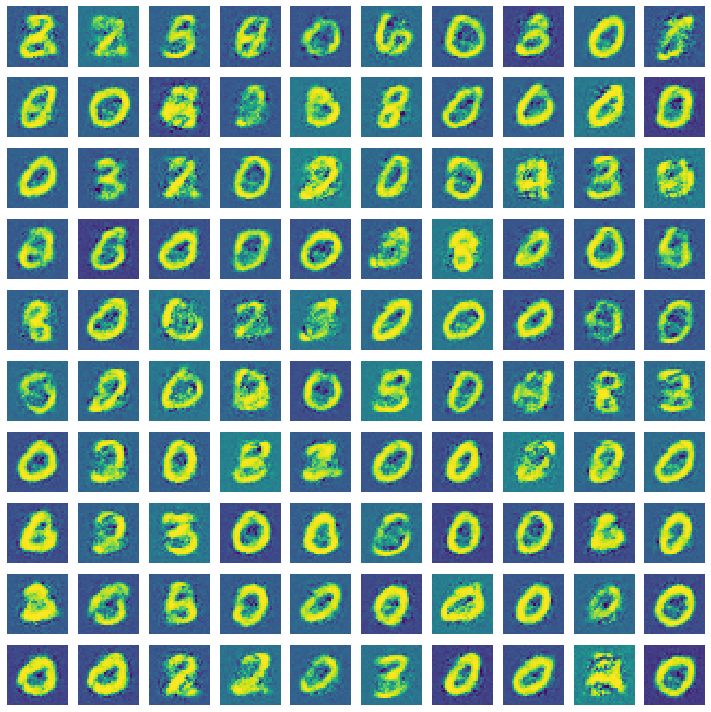

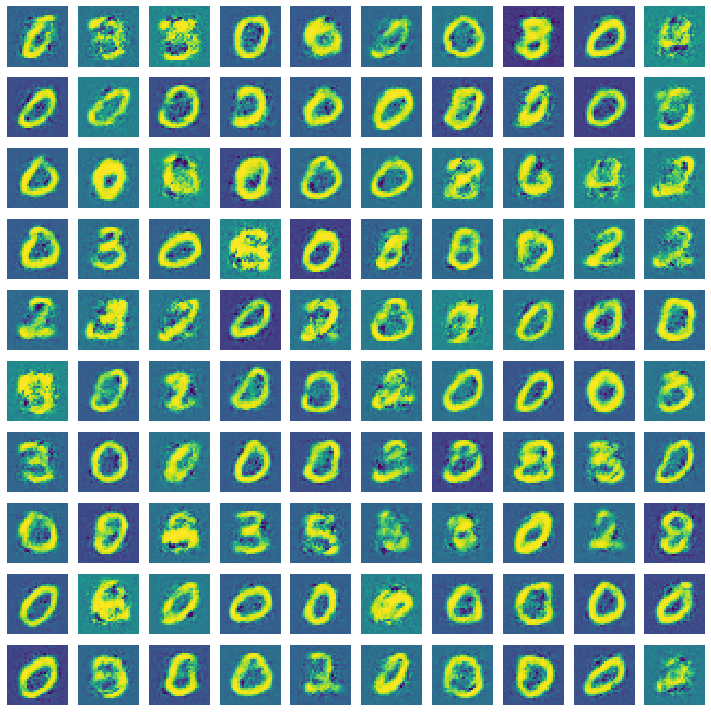

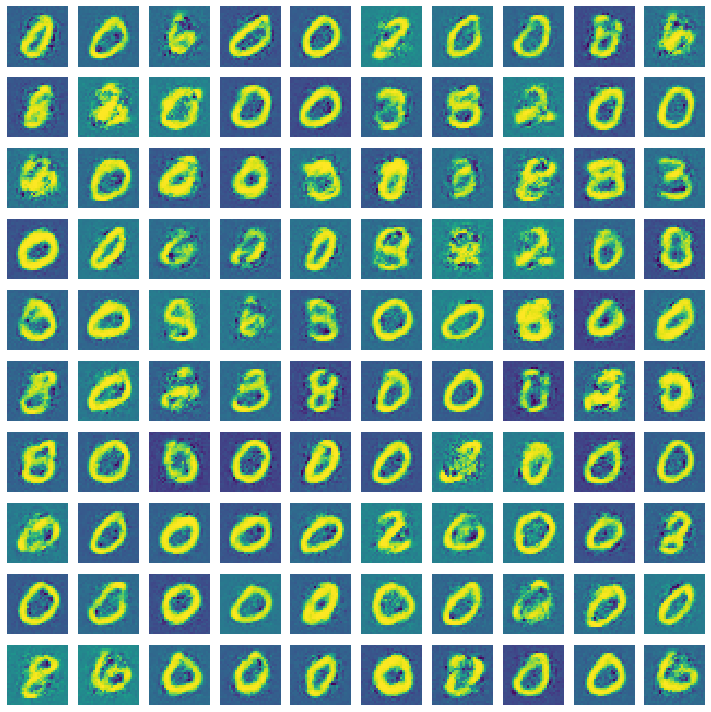

In [22]:
# generate GAN images at 300 epochs
if __name__ == '__main__':
    training(300, 128)

References:<br>
[1] Wikepedia <br>
[2] https://blog.keras.io/building-autoencoders-in-keras.html <br>
[3] https://keras.io/examples/mnist_acgan/ <br>
[4] https://www.tensorflow.org/tutorials/generative/dcgan <br>
[5] https://scikit-learn.org/stable/auto_examples/neural_networks/plot_rbm_logistic_classification.html#